# Fixed order testing

In this notebook, we test out the fixed order setting of our flow model. With a fixed ordering, the true ordering should produce the best likelihood compared to the rest. This is a first step to test out before we move on to learn the ordering itself.

In [1]:
import sys
sys.path.append('../')
import torch
import matplotlib.pyplot as plt
from notebook_setup import device, smooth_graph, create_new_set_of_models, train_models_and_get_histories, update_dict
from ocd.models.oslow import OSlow
from ocd.data.synthetic.graph_generator import GraphGenerator
from ocd.data.synthetic.utils import RandomGenerator
from ocd.data.synthetic.parametric import AffineParametericDataset
from ocd.data.synthetic.nonparametric import AffineNonParametericDataset
from ocd.models.normalization import ActNorm
from tqdm import tqdm
import numpy as np

%load_ext autoreload
%autoreload 2
print(device)


cuda


# Generate the causal graph

We will create a causal graph and then use the same graph to instantiate different synthetic datasets. By default we test on a full graph with true ordering: `[1, 0, 2]`. We will also instantiate generators that will be used for data generation.

In [2]:

graph_generator = GraphGenerator(
    num_nodes=3,
    seed=0,
    graph_type="full",
    enforce_ordering=[1, 0, 2],
)
graph = graph_generator.generate_dag()

# These generators are also needed to generate the data
gaussian_noise_generator = RandomGenerator('normal', seed=10, loc=0, scale=1)
laplace_noise_generator = RandomGenerator('laplace', seed=10, loc=0, scale=1)
link_generator = RandomGenerator('uniform', seed=110, low=1, high=1)

## Synthetic Data Generation (affine datasets)

Here generate a bunch of affine datasets that we intend to test out.

In [15]:
num_samples = 10000
# parameteric with sin(x) + x non-linearity and softplus
dset_sinusoidal = AffineParametericDataset(
    num_samples=num_samples,
    graph=graph,
    noise_generator=gaussian_noise_generator,
    link_generator=link_generator,
    link="sinusoid",
    perform_normalization=False,
)
# cubic link functions with softplus
dset_cubic = AffineParametericDataset(
    num_samples=num_samples,
    graph=graph,
    noise_generator=gaussian_noise_generator,
    link_generator=link_generator,
    link="cubic",
    perform_normalization=True,
)
# linear laplace with additive noise
dset_laplace_linear = AffineParametericDataset(
    num_samples=num_samples,
    graph=graph,
    noise_generator=laplace_noise_generator,
    link_generator=link_generator,
    link="linear",
    perform_normalization=False,
    additive=True,
)
# non-parameteric with no invertibility constraints
dset_nonparametric_affine = AffineNonParametericDataset(
    num_samples=1000,
    graph=graph,
    noise_generator=gaussian_noise_generator,
    invertibility_coefficient=0.0,
    perform_normalization=False,
    additive=False,
)
# non-parameteric with no invertibility constraints
dset_nonparametric_additive = AffineNonParametericDataset(
    num_samples=1000,
    graph=graph,
    noise_generator=gaussian_noise_generator,
    invertibility_coefficient=0.0,
    perform_normalization=False,
    additive=True,
)
# non-parameteric with invertibility constraints
dset_nonparametric_almost_invertible = AffineNonParametericDataset(
    num_samples=1000,
    graph=graph,
    noise_generator=gaussian_noise_generator,
    invertibility_coefficient=1.0,
    perform_normalization=False,
    additive=False,
)

all_datasets = {
    "sinusoidal": dset_sinusoidal,
    "cubic": dset_cubic,
    "laplace_linear": dset_laplace_linear,
    "nonparametric_additive_with_additive": dset_nonparametric_additive,
    "nonparametric_additive_with_affine": dset_nonparametric_additive,
    "nonparametric_affine_with_additive": dset_nonparametric_affine,
    "nonparametric_affine_with_affine": dset_nonparametric_affine,
    "nonparametric_almost_invertible_affine": dset_nonparametric_almost_invertible,
    "nonparametric_almost_invertible_additive": dset_nonparametric_almost_invertible,
}

# Change the following settings to change the model and training settings
use_standard_ordering = False

base_model_instantiation_setting = dict(
    additive = False,
    num_transforms = 1,
    normalization = ActNorm,
    base_distribution = torch.distributions.Normal(loc=0, scale=1),
    use_standard_ordering=use_standard_ordering,
)

base_training_setting = dict(
    batch_size=128, 
    lr=0.005, 
    epoch_count=100,
    use_standard_ordering=use_standard_ordering,
)

all_models_setting = {
    "sinusoidal": update_dict(base_model_instantiation_setting),
    "cubic": update_dict(base_model_instantiation_setting),
    "laplace_linear": update_dict(base_model_instantiation_setting, additive=True, base_distribution=torch.distributions.Laplace(loc=0, scale=1)),
    "nonparametric_additive_with_additive": update_dict(base_model_instantiation_setting, additive=True),
    "nonparametric_additive_with_affine": update_dict(base_model_instantiation_setting),
    "nonparametric_affine_with_additive": update_dict(base_model_instantiation_setting, additive=True),
    "nonparametric_affine_with_affine": update_dict(base_model_instantiation_setting),
    "nonparametric_almost_invertible_affine": update_dict(base_model_instantiation_setting),
    "nonparametric_almost_invertible_additive": update_dict(base_model_instantiation_setting, additive=True),
    
}

all_training_settings = {
    "sinusoidal": update_dict(base_training_setting, epoch_count=33, batch_size=512),
    "cubic": update_dict(base_training_setting, epoch_count=55, batch_size=1024),
    "laplace_linear": update_dict(base_training_setting, epoch_count=33, batch_size=512),
    "nonparametric_additive_with_additive": update_dict(base_training_setting),
    "nonparametric_additive_with_affine": update_dict(base_training_setting),
    "nonparametric_affine_with_additive": update_dict(base_training_setting),
    "nonparametric_affine_with_affine": update_dict(base_training_setting),
    "nonparametric_almost_invertible_affine": update_dict(base_training_setting),
    "nonparametric_almost_invertible_additive": update_dict(base_training_setting),
}

window_sizes = {
    "sinusoidal": 100,
    "cubic": 100,
    "laplace_linear": 100,
    "nonparametric_additive_with_additive": 100,
    "nonparametric_additive_with_affine": 100,
    "nonparametric_affine_with_additive": 100,
    "nonparametric_affine_with_affine": 100,
    "nonparametric_almost_invertible_affine": 100,
    "nonparametric_almost_invertible_additive": 100,
}

# what portion of the ending epochs to show in the output history
output_history_portion = {
    "sinusoidal": 0.1, # only show the last 0.1 of the epochs
    "cubic": 0.5,
    "laplace_linear": 0.5,
    "nonparametric_additive_with_additive": 0.5,
    "nonparametric_additive_with_affine": 0.5,
    "nonparametric_affine_with_additive": 0.5,
    "nonparametric_affine_with_affine": 0.5,
    "nonparametric_almost_invertible_affine": 0.5,
    "nonparametric_almost_invertible_additive": 0.5,
}

## Model Training (Affine)

sinusoidal


training model 210: 100%|██████████| 33/33 [00:14<00:00,  2.32it/s]


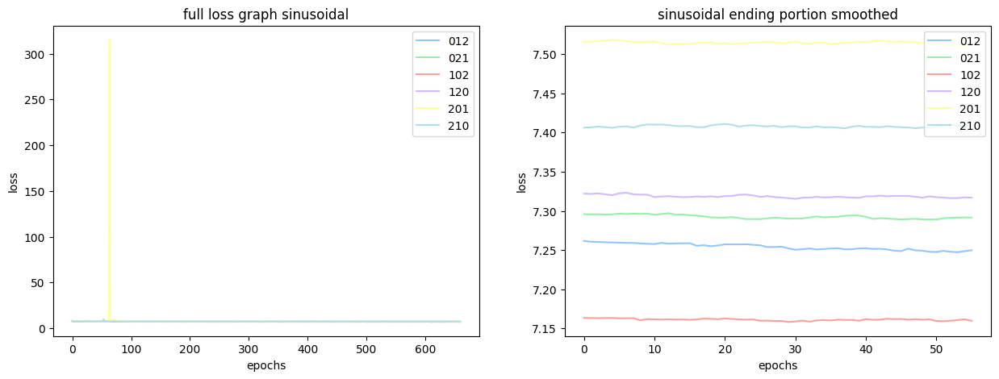

cubic


training model 210: 100%|██████████| 55/55 [00:15<00:00,  3.44it/s]


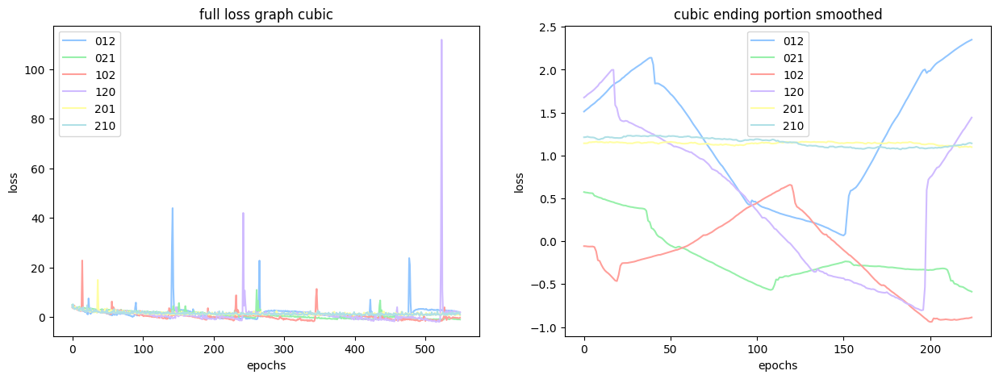

laplace_linear


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.47it/s]


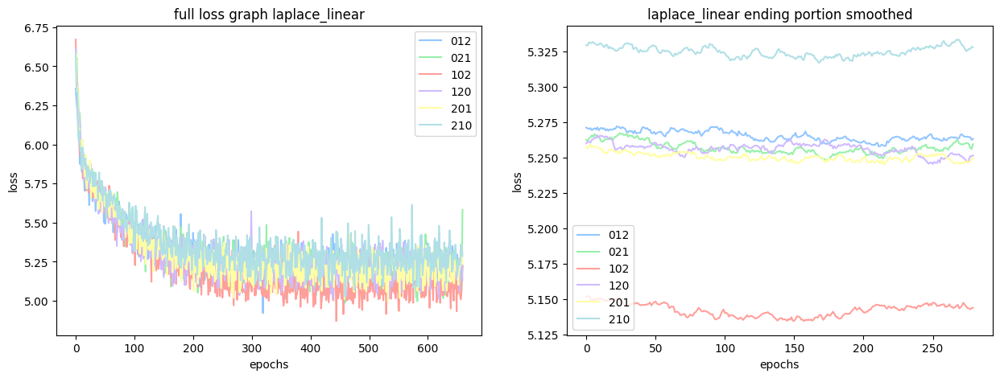

nonparametric_additive_with_additive


training model 210: 100%|██████████| 100/100 [00:07<00:00, 13.05it/s]


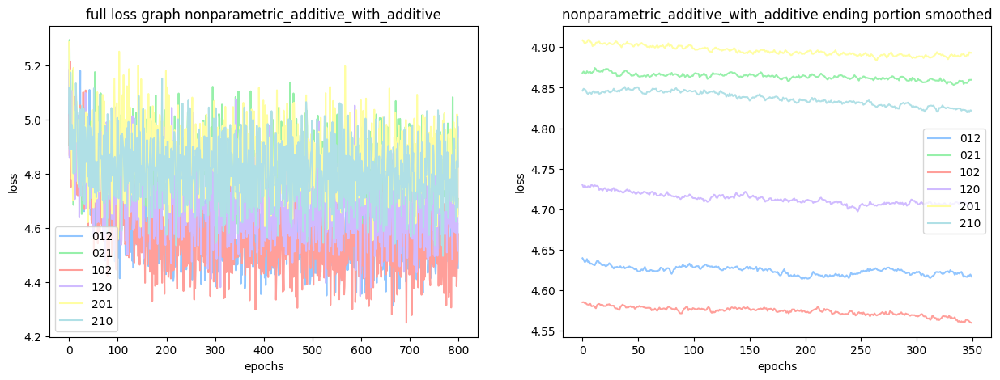

nonparametric_additive_with_affine


training model 210: 100%|██████████| 100/100 [00:14<00:00,  7.03it/s]


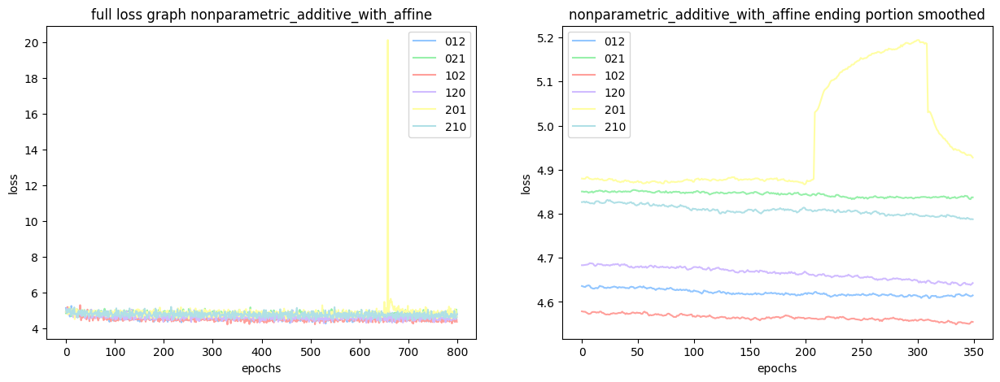

nonparametric_affine_with_additive


training model 210: 100%|██████████| 100/100 [00:07<00:00, 12.90it/s]


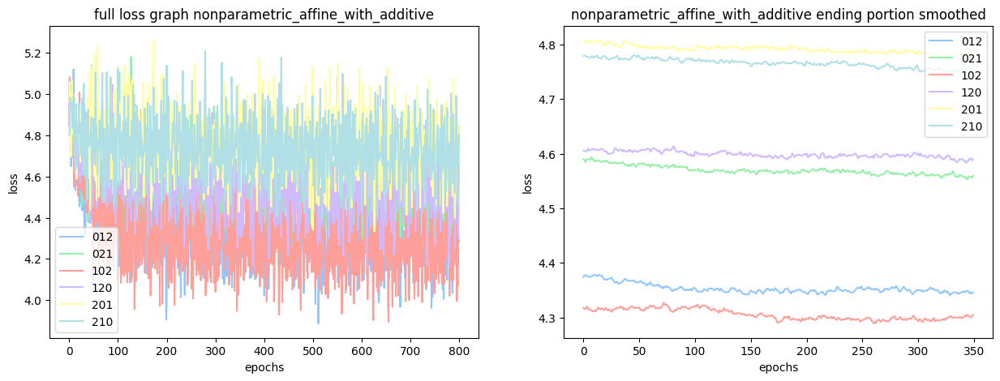

nonparametric_affine_with_affine


training model 210: 100%|██████████| 100/100 [00:14<00:00,  6.93it/s]


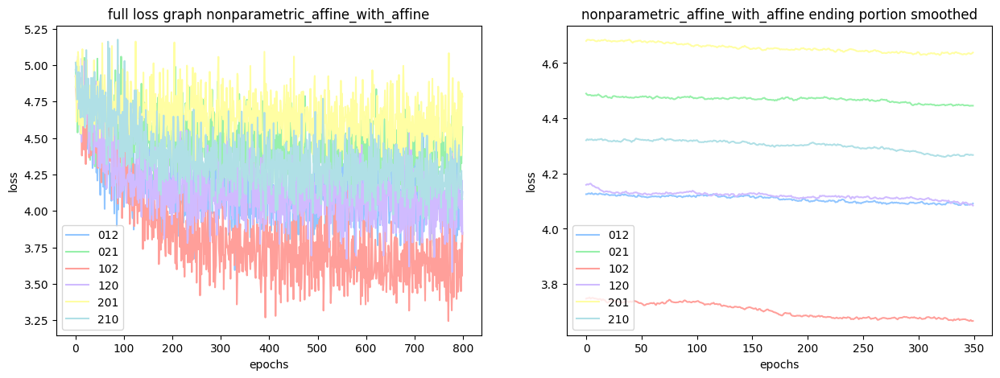

nonparametric_almost_invertible_affine


training model 210: 100%|██████████| 100/100 [00:14<00:00,  6.96it/s]


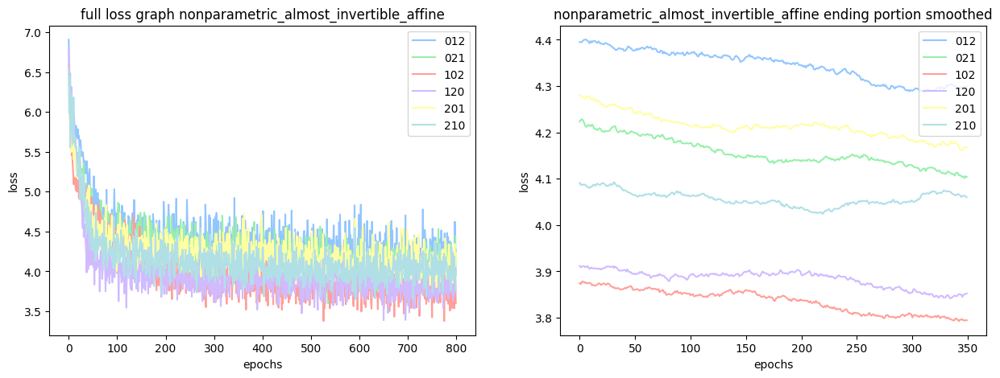

nonparametric_almost_invertible_additive


training model 210: 100%|██████████| 100/100 [00:07<00:00, 12.96it/s]


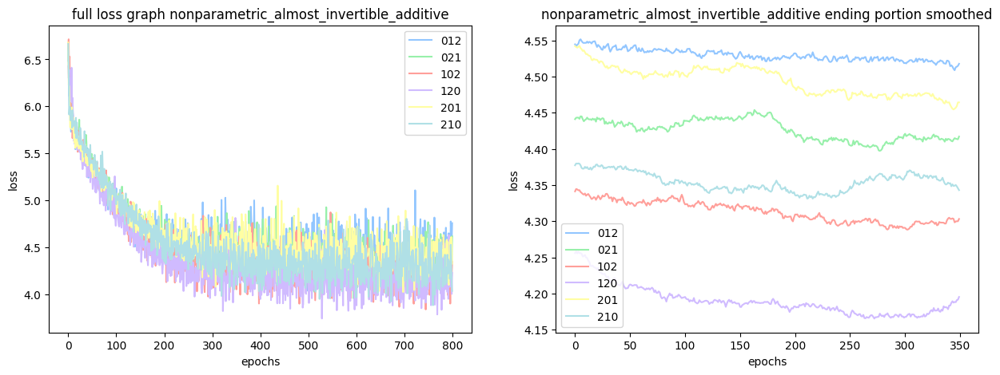

In [16]:
# comment to select the ones you want to plot
subset_to_consider = [
    "sinusoidal", # only show the last 0.1 of the epochs
    "cubic",
    "laplace_linear",
    "nonparametric_additive_with_additive",
    "nonparametric_additive_with_affine",
    "nonparametric_affine_with_additive",
    "nonparametric_affine_with_affine",
    "nonparametric_almost_invertible_affine",
    "nonparametric_almost_invertible_additive",
]
all_models_trained = {}
for key in subset_to_consider:
    print(key)
    dset = all_datasets[key]
    all_models_trained[key] = create_new_set_of_models(**all_models_setting[key])
    all_histories = train_models_and_get_histories(**all_training_settings[key], dset=dset, all_models=all_models_trained[key])

    smoothed_histories = smooth_graph(all_histories, window_size=window_sizes[key])
    # create two subplots and unpack the output array immediately
    plt.figure(figsize=(15, 5))
    plt.subplot(121)
    plt.title(f"full loss graph {key}")
    plt.xlabel("epochs")
    plt.ylabel("loss")
    for order in all_histories.keys():
        plt.plot(all_histories[order], label=order)
    plt.legend()
    plt.subplot(122)
    plt.xlabel("epochs")
    plt.ylabel("loss")
    for order in all_histories.keys():
        ending_portion = int(output_history_portion[key] * len(smoothed_histories[order]))
        plt.plot(smoothed_histories[order][-ending_portion:], label=order)
    plt.title(f"{key} ending portion smoothed")
    plt.legend()
    plt.show()

**Sampling check**: Now we pick a single dataset with its trained models and draw samples from the flow model and compare the marginals to the true marginals by creating a qqplot for each dimension.

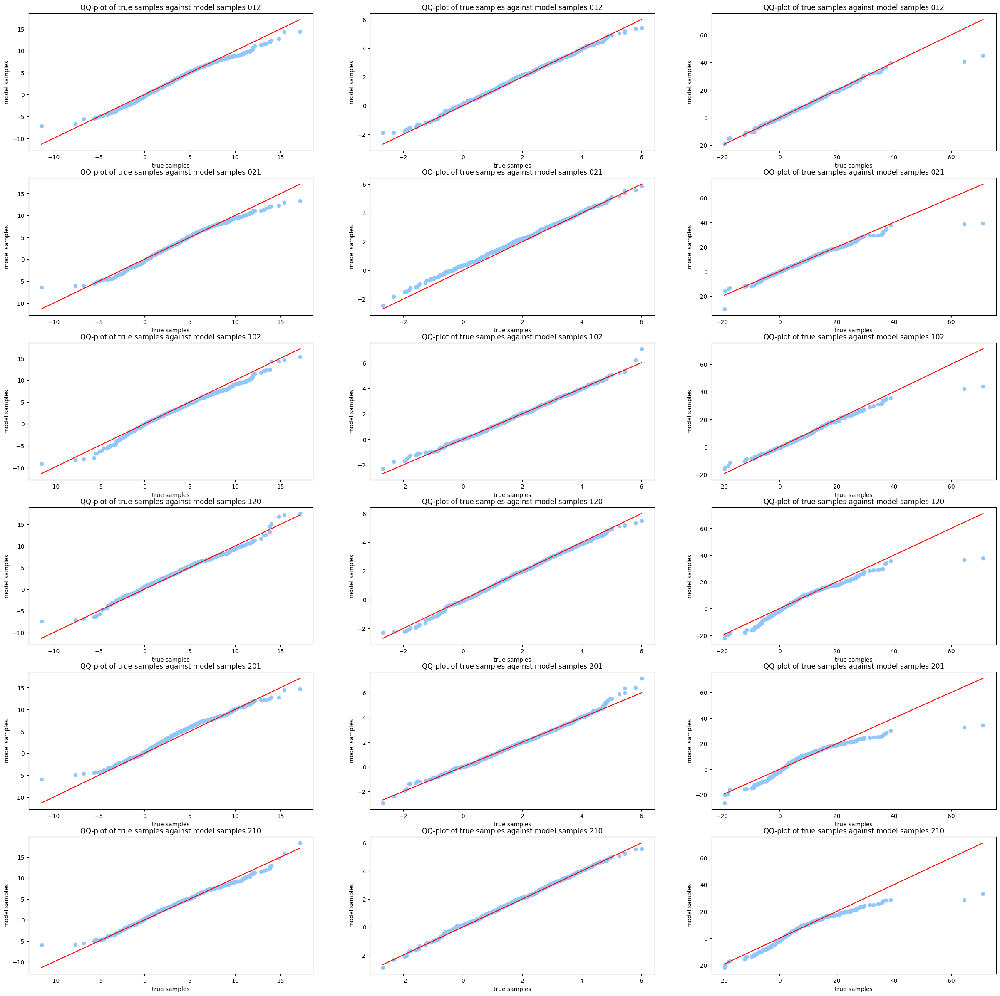

In [17]:
case_to_consider = "sinusoidal"

all_models = all_models_trained[case_to_consider]
dset = all_datasets[case_to_consider]

# create a figure with 18 subplots with 6 rows and 3 columns
fig, axs = plt.subplots(6, 3, figsize=(30, 30))
# iterate over the rows
i = 0
for key, model in all_models.items():
    model.eval()
    
    order = [int(x) for x in key]
    # create a permutation matrix from the order
    permutation_matrix = torch.zeros((3, 3))
    for i_, j_ in enumerate(order):
        permutation_matrix[i_, j_] = 1
    
    with torch.no_grad():
        if use_standard_ordering:
            model_samples = model.sample(1000, perm_mat=permutation_matrix).cpu().numpy()
        else:
            model_samples = model.sample(1000).cpu().numpy()
        # iterate over the columns
        for j in range(3):
            true_samples = dset.samples[j].values
            # create a qqplot of the true samples against the model samples by first sorting them
            model_samples_sorted = np.sort(model_samples[:, j])
            true_samples_sorted = np.sort(true_samples[:1000])
            axs[i, j].scatter(true_samples_sorted, model_samples_sorted, label="qqplot")
            # add title and x_label and y_label to the plot
            axs[i, j].set_title(f"QQ-plot of true samples against model samples {key}")
            axs[i, j].set_xlabel("true samples")
            axs[i, j].set_ylabel("model samples")
            # add an identity line to the plot
            axs[i, j].plot(
                [min(true_samples_sorted), max(true_samples_sorted)],
                [min(true_samples_sorted), max(true_samples_sorted)],
                label="identity",
                color='red'
            )
    i += 1
plt.show()

# Post-Non-Linear (PNL)

Here, we also model some post-non-linear models as well to show that the flow formulation is more general than the affine setting.


In [3]:

# Change the following settings to change the model and training settings
use_standard_ordering = False

base_model_instantiation_setting = dict(
    additive = True,
    num_transforms = 1,
    normalization = ActNorm,
    base_distribution = torch.distributions.Normal(loc=0, scale=1),
    use_standard_ordering=use_standard_ordering,
    num_post_nonlinear_transforms=1,
    tail_bound=10.,
    identity_init=True,
)

base_training_setting = dict(
    batch_size=128, 
    lr=0.005, 
    epoch_count=100,
    use_standard_ordering=use_standard_ordering,
)

link_format = ['sinusoid', 'cubic', 'nonparametric']
post_non_linear_transform_format = ['sinusoid', 'softplus', 'nonparametric']
additive_or_affine_format = [False, True]

all_datasets = {}
all_models_setting = {}
all_training_settings = {}
window_sizes = {}
output_history_portion = {}

for link in link_format:
    for pnl in post_non_linear_transform_format:
        for additive in additive_or_affine_format:
            name = '{}_{}_links_{}'.format(pnl, link, 'affine' if not additive else 'additive')
            num_samples = 1000 if link == 'nonparametric' else 10000
            if link == 'nonparametric':
                dset = AffineNonParametericDataset(
                    num_samples=num_samples,
                    graph=graph,
                    noise_generator=gaussian_noise_generator,
                    invertibility_coefficient=1.0,
                    perform_normalization=False, # No normalization in these cases because it effects the pnl characteristics
                    additive=additive,
                    post_non_linear_transform=pnl,
                )
            else:
                dset = AffineParametericDataset(
                    num_samples=num_samples,
                    graph=graph,
                    noise_generator=gaussian_noise_generator,
                    link_generator=link_generator,
                    link=link,
                    perform_normalization=False, # No normalization in these cases because it effects the pnl characteristics
                    post_non_linear_transform=pnl,
                    additive=additive,
                )
            
            for model_additive_or_affine in additive_or_affine_format:
                for model_has_pnl in [True, False]:
                    name_ = '{}_MODEL_{}_{}'.format(name, 'affine' if not model_additive_or_affine else 'additive', 'pnl' if model_has_pnl else 'nopnl')
                    all_datasets[name_] = dset
                    all_models_setting[name_] = update_dict(
                        base_model_instantiation_setting, 
                        additive=model_additive_or_affine, 
                        num_post_nonlinear_transforms=3 if model_has_pnl else 0
                    )
                    all_training_settings[name_] = update_dict(base_training_setting, epoch_count=330 if link == 'nonparametric' else 33, batch_size=512)
                    window_sizes[name_] = 100
                    output_history_portion[name_] = 0.5
                    

/home/hamid/projects/ocdaf/notebooks/../ocd/data/synthetic/utils.py:41: RuntimeWarning: overflow encountered in exp
  return np.where(x > threshold, x, np.log(1 + np.exp(x)))
/home/hamid/projects/ocdaf/notebooks/../ocd/data/synthetic/utils.py:41: RuntimeWarning: overflow encountered in exp
  return np.where(x > threshold, x, np.log(1 + np.exp(x)))
/home/hamid/projects/ocdaf/notebooks/../ocd/data/synthetic/utils.py:41: RuntimeWarning: overflow encountered in exp
  return np.where(x > threshold, x, np.log(1 + np.exp(x)))
/home/hamid/projects/ocdaf/notebooks/../ocd/data/synthetic/utils.py:41: RuntimeWarning: overflow encountered in exp
  return np.where(x > threshold, x, np.log(1 + np.exp(x)))
/home/hamid/projects/ocdaf/notebooks/../ocd/data/synthetic/utils.py:58: RuntimeWarning: overflow encountered in exp
  return np.where(x > 20., x, np.log(1 + np.exp(x)))
/home/hamid/projects/ocdaf/notebooks/../ocd/data/synthetic/utils.py:58: RuntimeWarning: overflow encountered in exp
  return np.whe

sinusoid_sinusoid_links_affine_MODEL_affine_pnl [1/72]


training model 210: 100%|██████████| 33/33 [00:32<00:00,  1.03it/s]


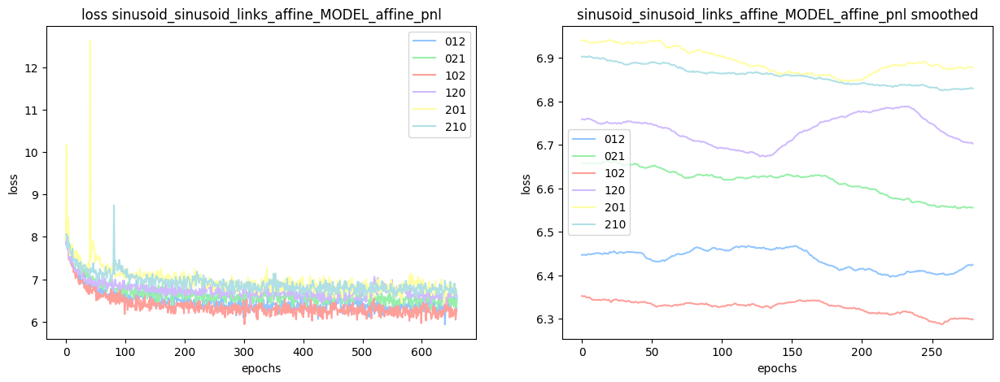

sinusoid_sinusoid_links_affine_MODEL_affine_nopnl [2/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.41it/s]


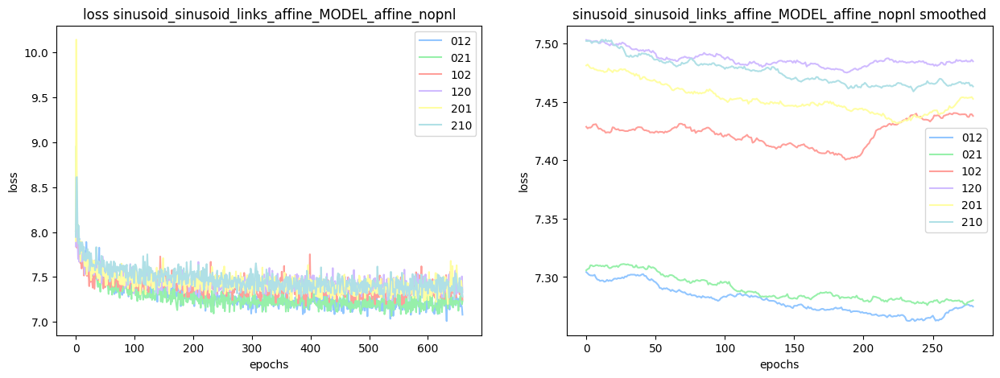

sinusoid_sinusoid_links_affine_MODEL_additive_pnl [3/72]


training model 210: 100%|██████████| 33/33 [00:28<00:00,  1.15it/s]


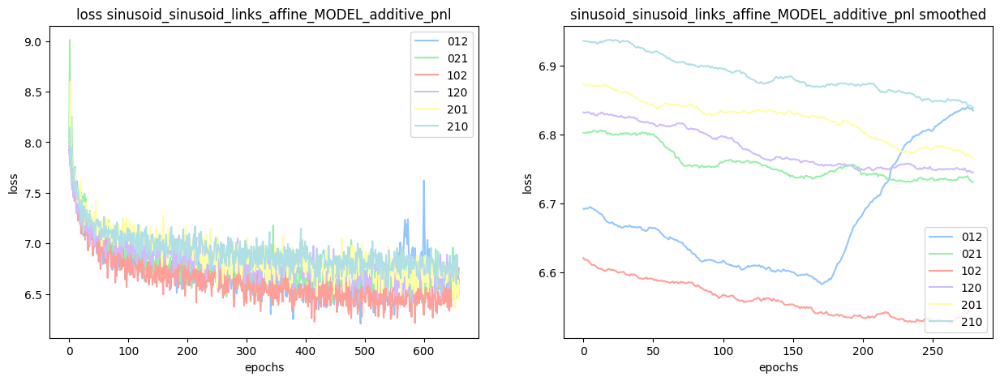

sinusoid_sinusoid_links_affine_MODEL_additive_nopnl [4/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.25it/s]


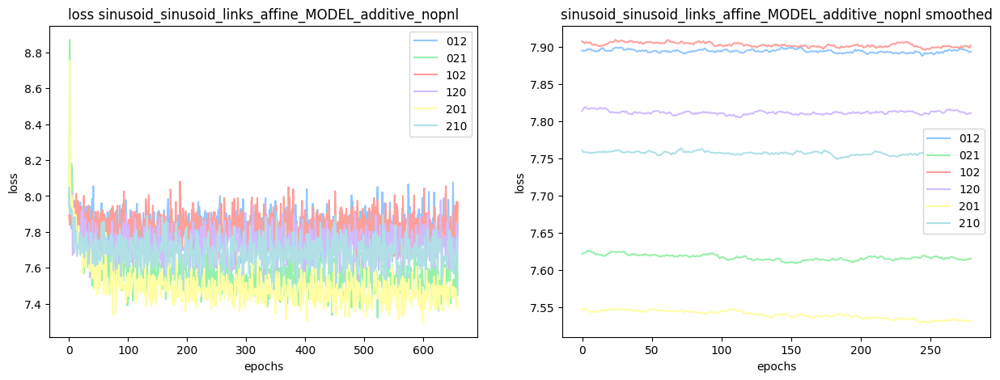

sinusoid_sinusoid_links_additive_MODEL_affine_pnl [5/72]


training model 210: 100%|██████████| 33/33 [00:32<00:00,  1.00it/s]


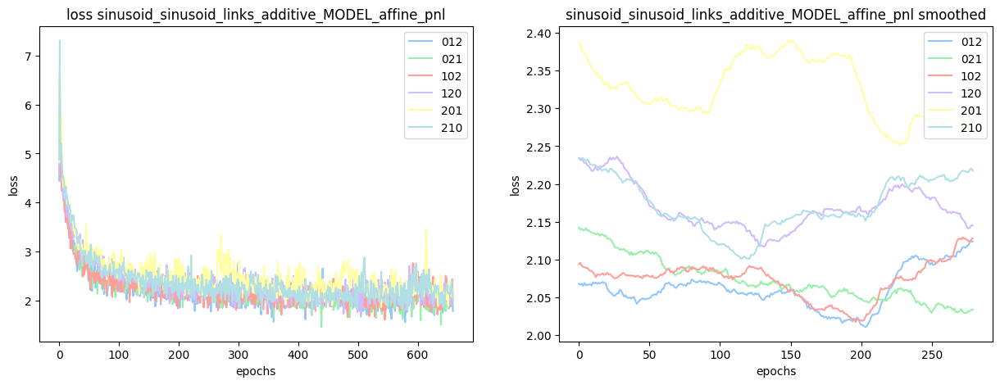

sinusoid_sinusoid_links_additive_MODEL_affine_nopnl [6/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.43it/s]


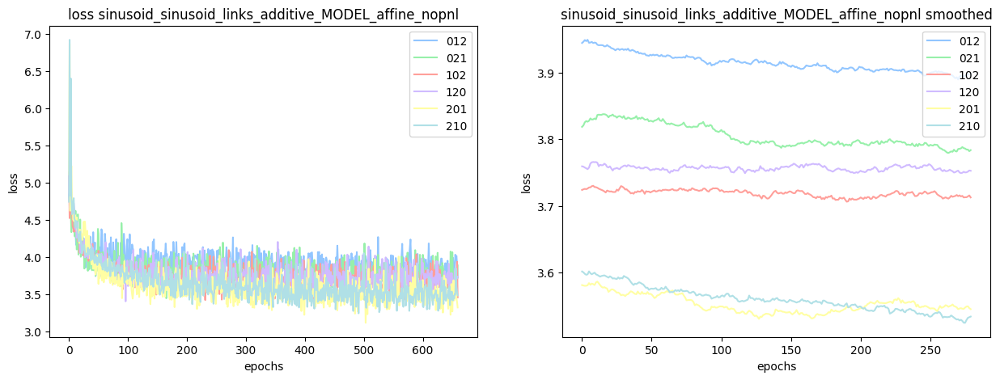

sinusoid_sinusoid_links_additive_MODEL_additive_pnl [7/72]


training model 210: 100%|██████████| 33/33 [00:29<00:00,  1.12it/s]


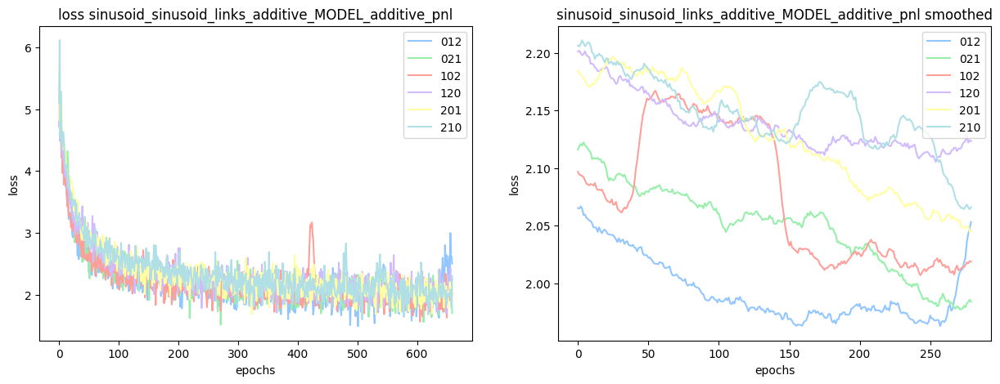

sinusoid_sinusoid_links_additive_MODEL_additive_nopnl [8/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.31it/s]


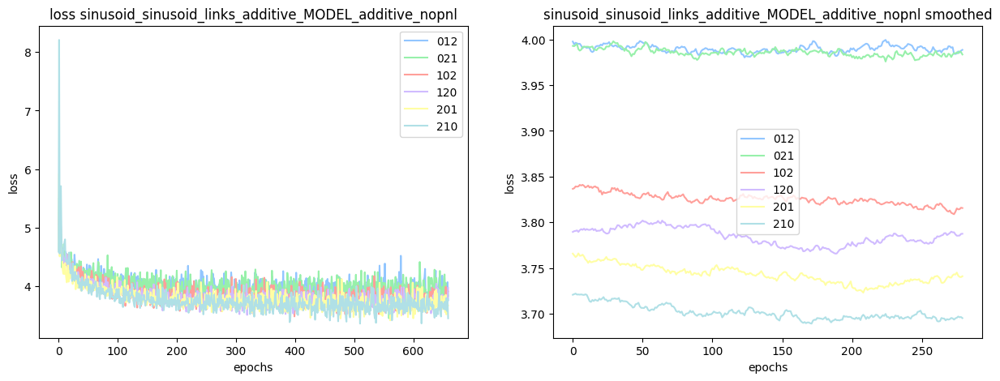

softplus_sinusoid_links_affine_MODEL_affine_pnl [9/72]


training model 210: 100%|██████████| 33/33 [00:32<00:00,  1.02it/s]


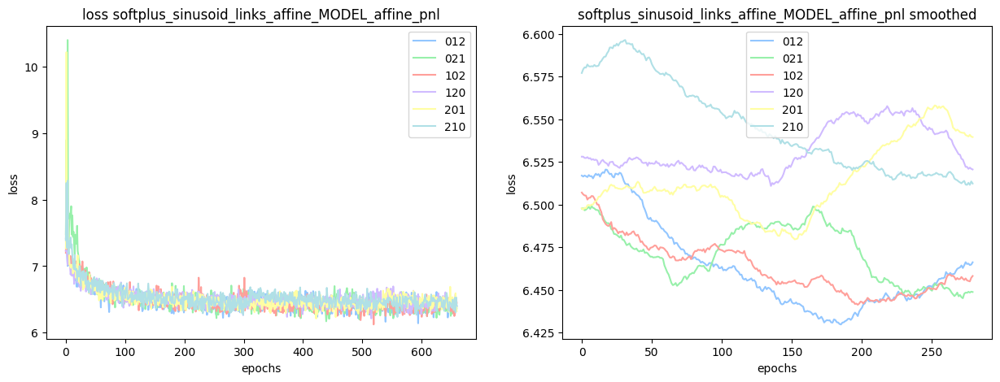

softplus_sinusoid_links_affine_MODEL_affine_nopnl [10/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.40it/s]


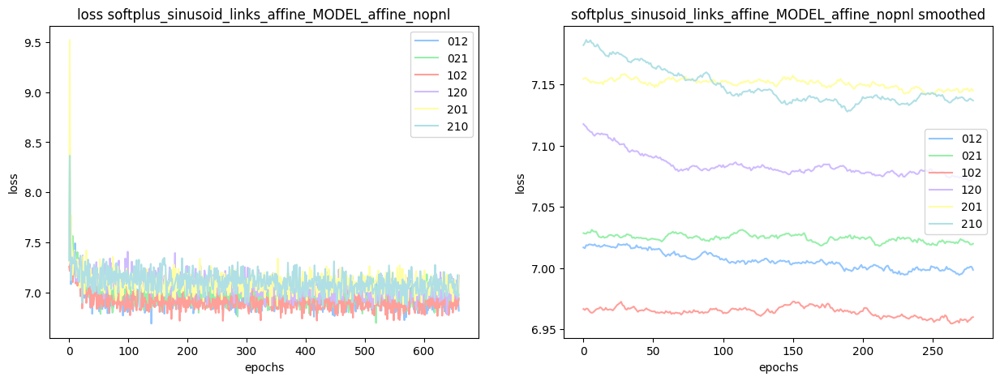

softplus_sinusoid_links_affine_MODEL_additive_pnl [11/72]


training model 210: 100%|██████████| 33/33 [00:30<00:00,  1.09it/s]


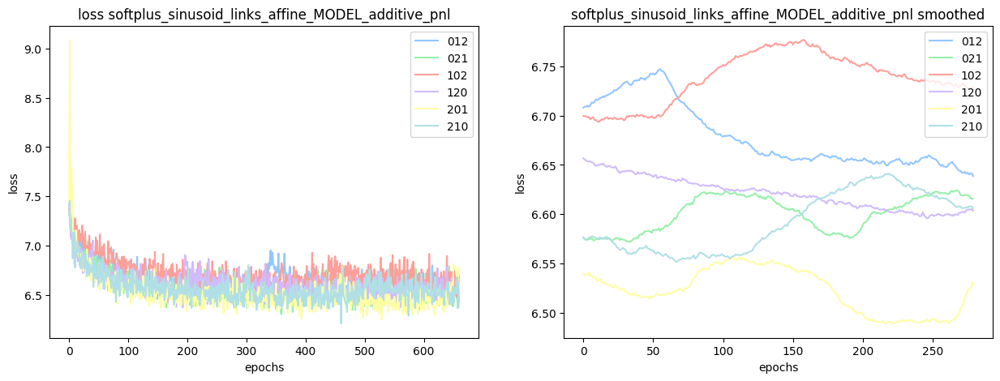

softplus_sinusoid_links_affine_MODEL_additive_nopnl [12/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.26it/s]


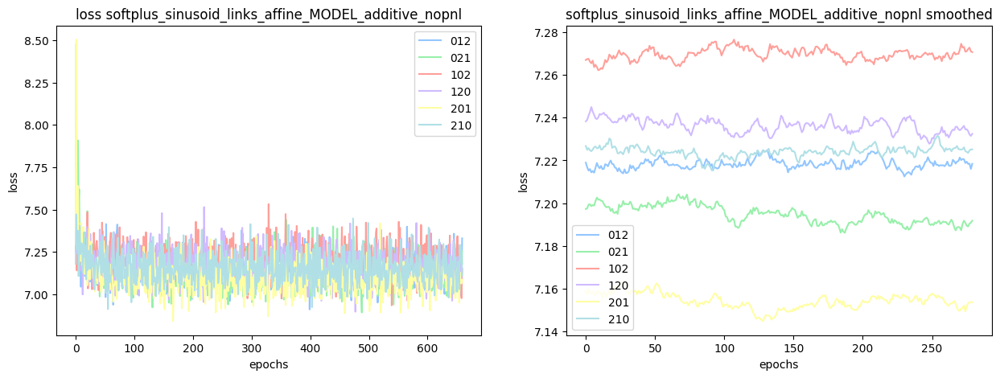

softplus_sinusoid_links_additive_MODEL_affine_pnl [13/72]


training model 210: 100%|██████████| 33/33 [00:32<00:00,  1.02it/s]


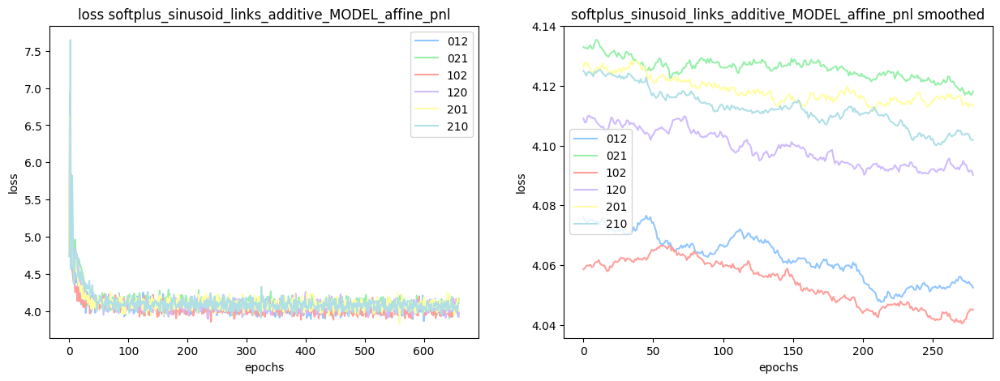

softplus_sinusoid_links_additive_MODEL_affine_nopnl [14/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.44it/s]


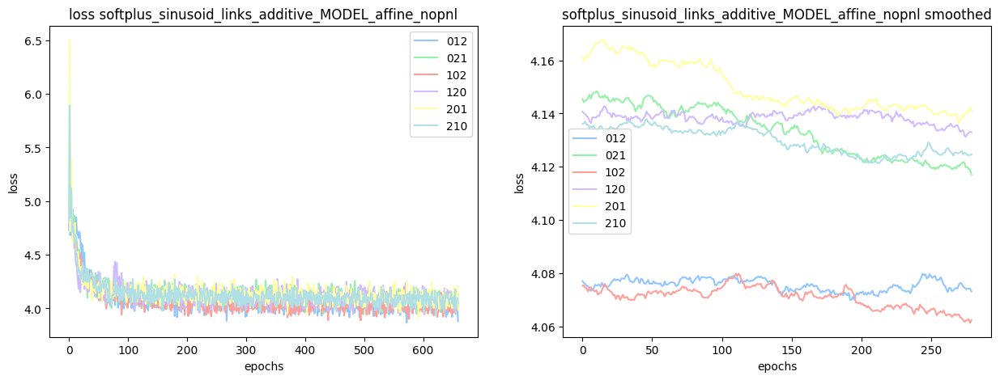

softplus_sinusoid_links_additive_MODEL_additive_pnl [15/72]


training model 210: 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]


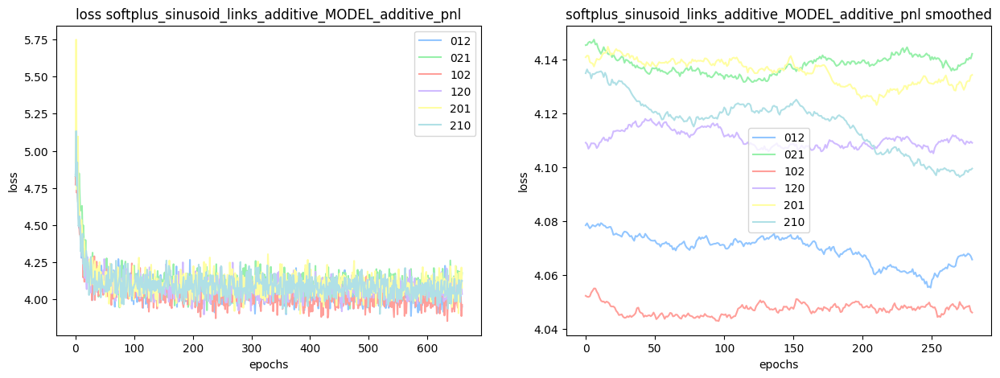

softplus_sinusoid_links_additive_MODEL_additive_nopnl [16/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.27it/s]


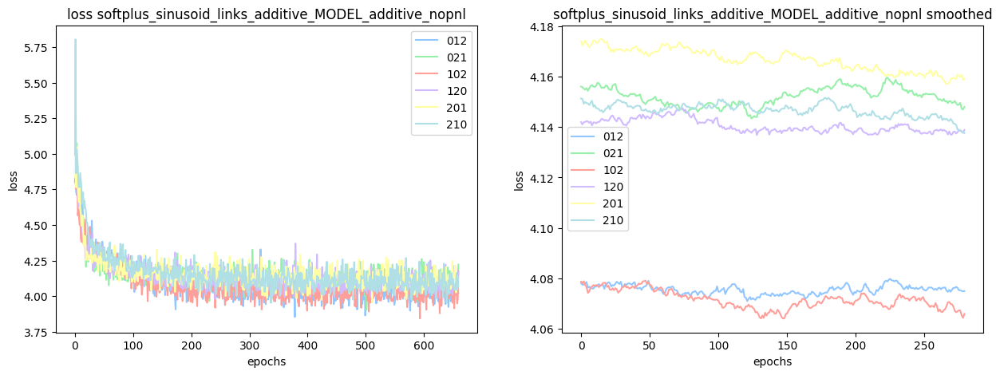

nonparametric_sinusoid_links_affine_MODEL_affine_pnl [17/72]


training model 210: 100%|██████████| 33/33 [00:33<00:00,  1.01s/it]


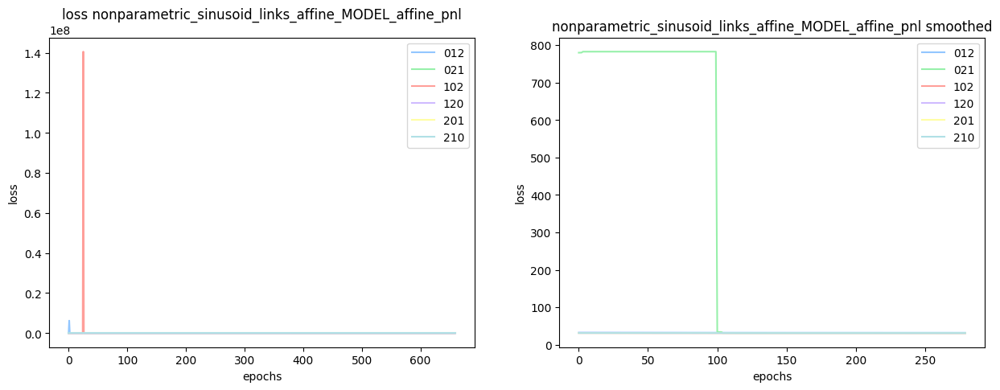

nonparametric_sinusoid_links_affine_MODEL_affine_nopnl [18/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.44it/s]


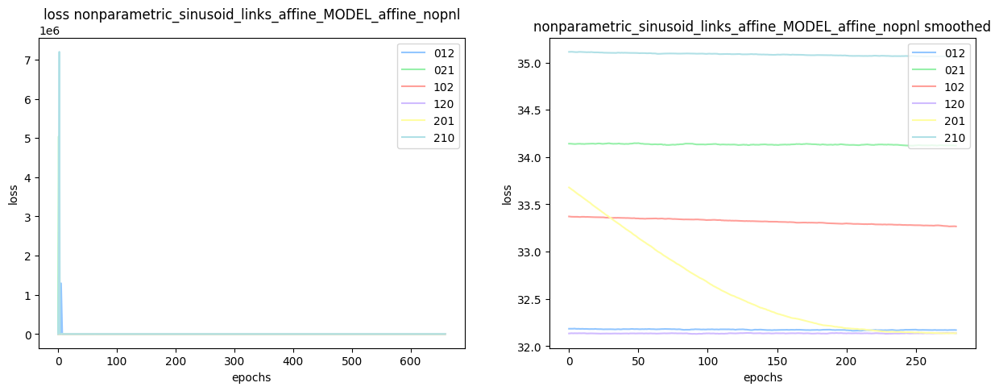

nonparametric_sinusoid_links_affine_MODEL_additive_pnl [19/72]


training model 210: 100%|██████████| 33/33 [00:28<00:00,  1.16it/s]


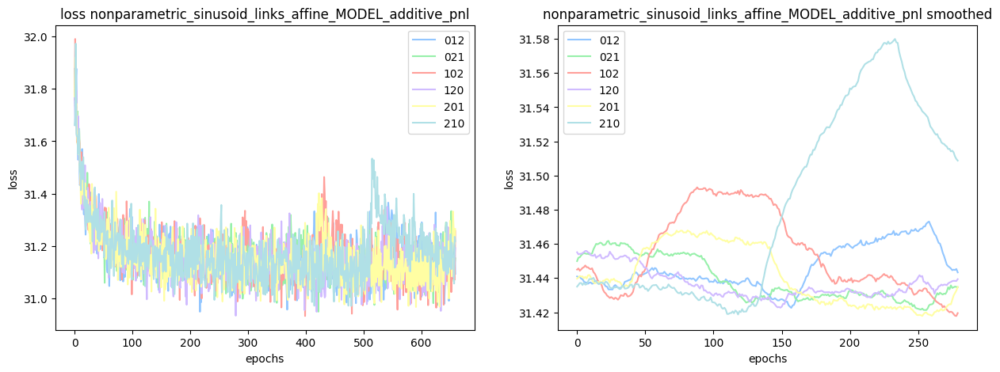

nonparametric_sinusoid_links_affine_MODEL_additive_nopnl [20/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.28it/s]


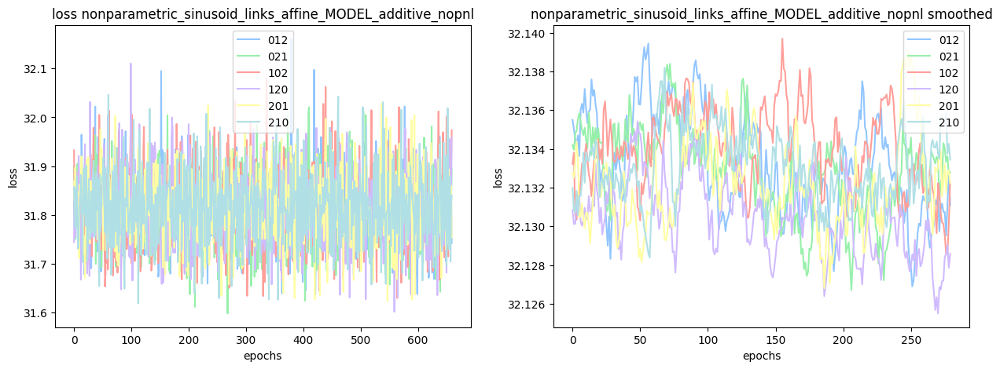

nonparametric_sinusoid_links_additive_MODEL_affine_pnl [21/72]


training model 210: 100%|██████████| 33/33 [00:30<00:00,  1.09it/s]


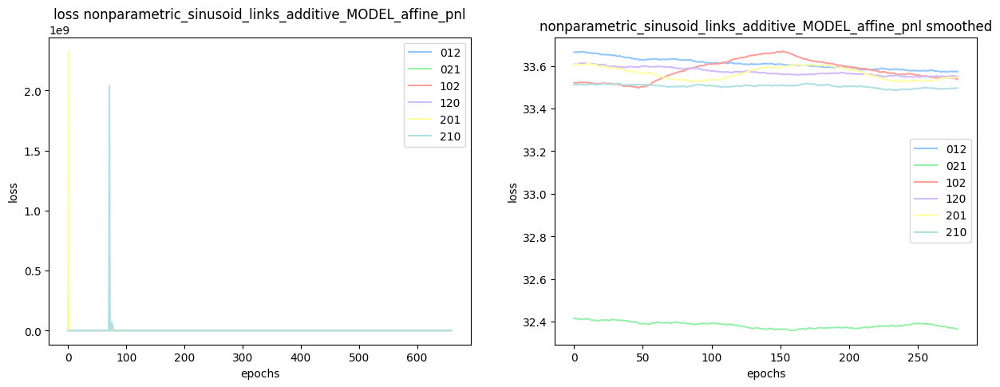

nonparametric_sinusoid_links_additive_MODEL_affine_nopnl [22/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.43it/s]


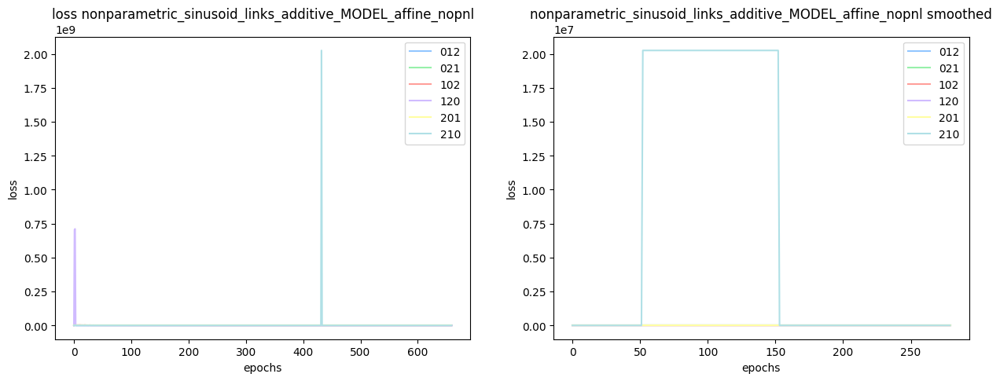

nonparametric_sinusoid_links_additive_MODEL_additive_pnl [23/72]


training model 210: 100%|██████████| 33/33 [00:28<00:00,  1.17it/s]


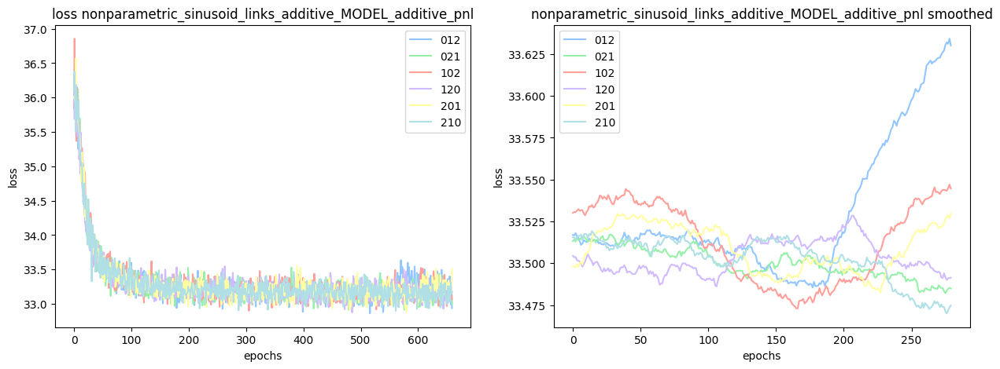

nonparametric_sinusoid_links_additive_MODEL_additive_nopnl [24/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.22it/s]


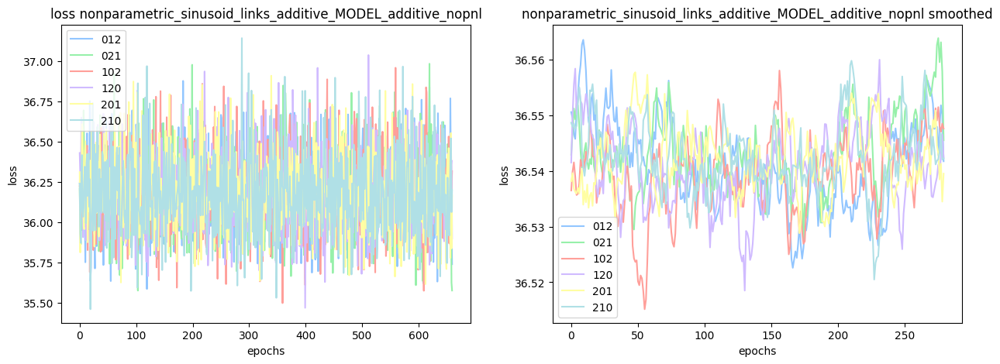

sinusoid_cubic_links_affine_MODEL_affine_pnl [25/72]


training model 210: 100%|██████████| 33/33 [00:34<00:00,  1.04s/it]


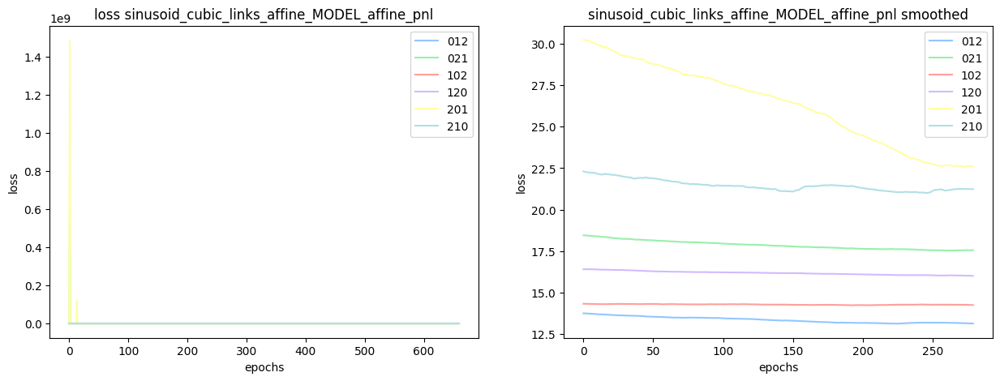

sinusoid_cubic_links_affine_MODEL_affine_nopnl [26/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.41it/s]


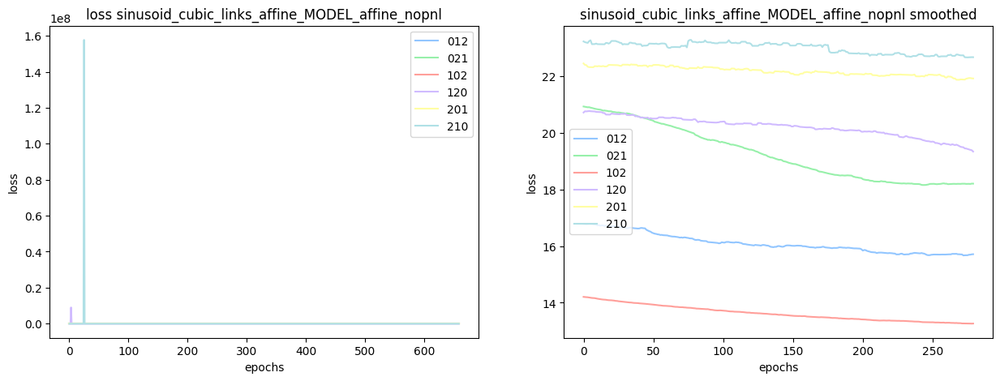

sinusoid_cubic_links_affine_MODEL_additive_pnl [27/72]


training model 210: 100%|██████████| 33/33 [00:30<00:00,  1.09it/s]


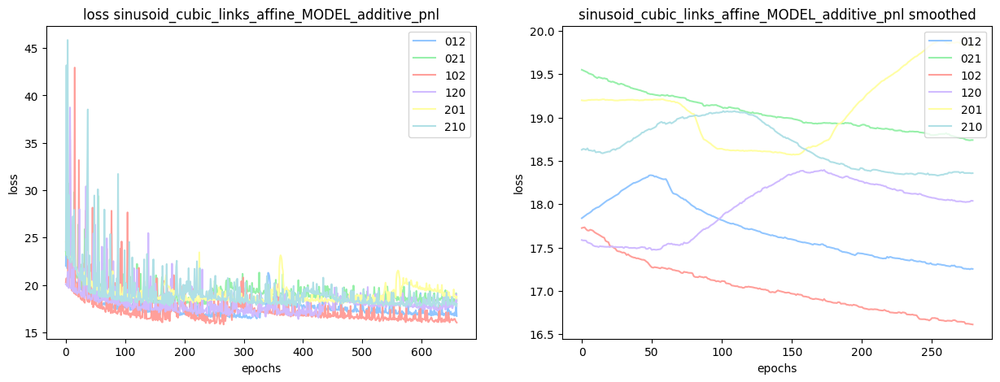

sinusoid_cubic_links_affine_MODEL_additive_nopnl [28/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.22it/s]


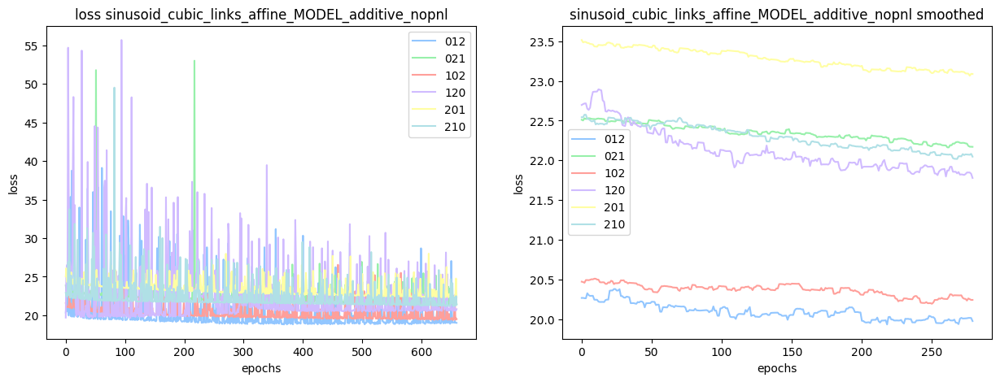

sinusoid_cubic_links_additive_MODEL_affine_pnl [29/72]


training model 210: 100%|██████████| 33/33 [00:33<00:00,  1.01s/it]


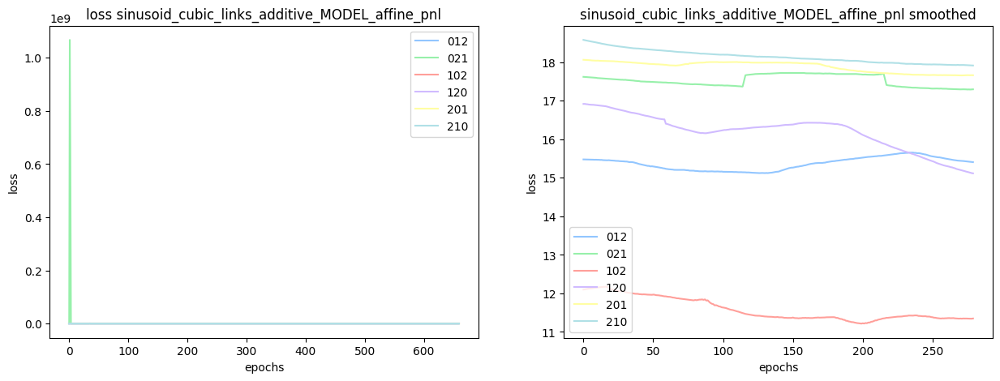

sinusoid_cubic_links_additive_MODEL_affine_nopnl [30/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.42it/s]


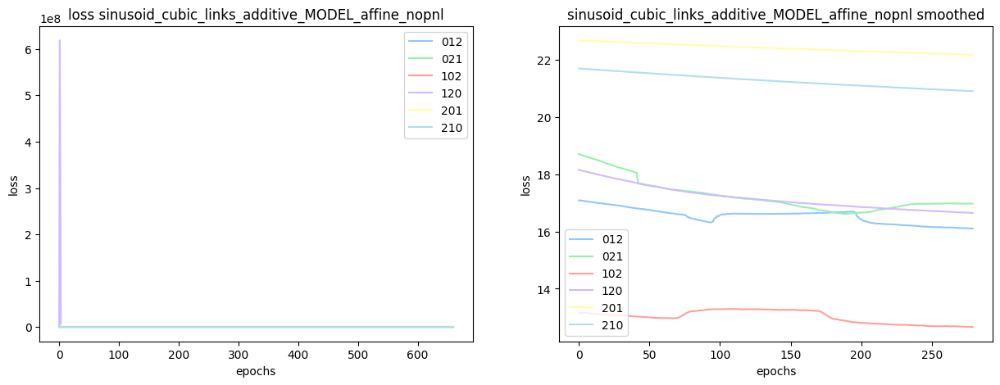

sinusoid_cubic_links_additive_MODEL_additive_pnl [31/72]


training model 210: 100%|██████████| 33/33 [00:27<00:00,  1.21it/s]


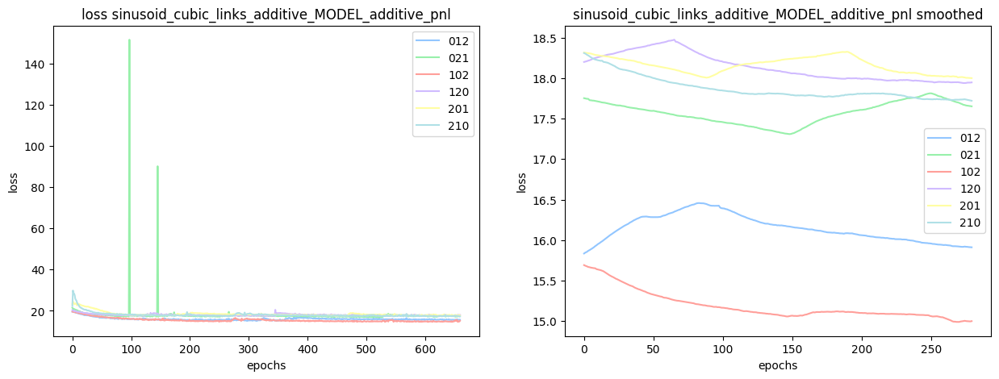

sinusoid_cubic_links_additive_MODEL_additive_nopnl [32/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.28it/s]


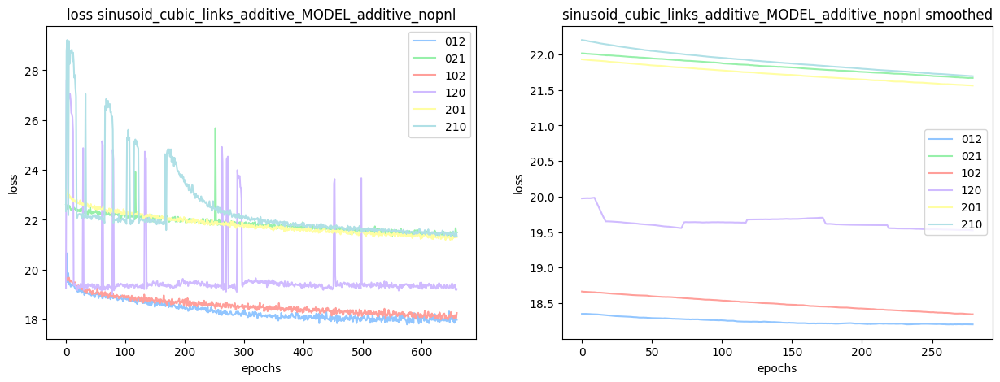

softplus_cubic_links_affine_MODEL_affine_pnl [33/72]


training model 210: 100%|██████████| 33/33 [00:35<00:00,  1.07s/it]


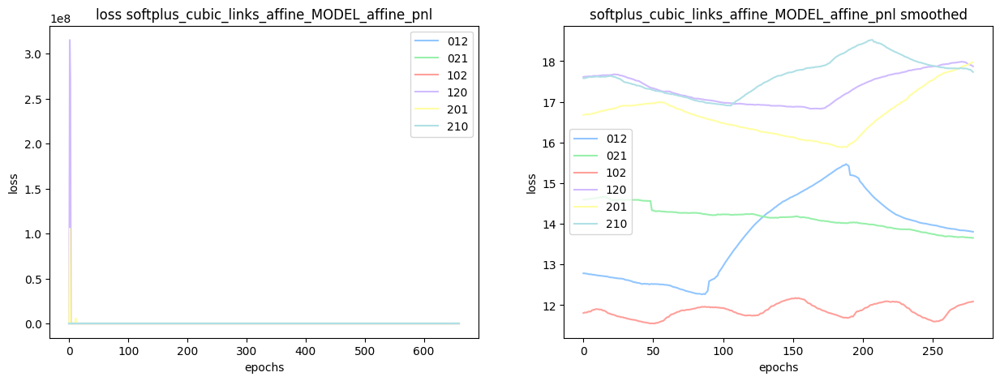

softplus_cubic_links_affine_MODEL_affine_nopnl [34/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.45it/s]


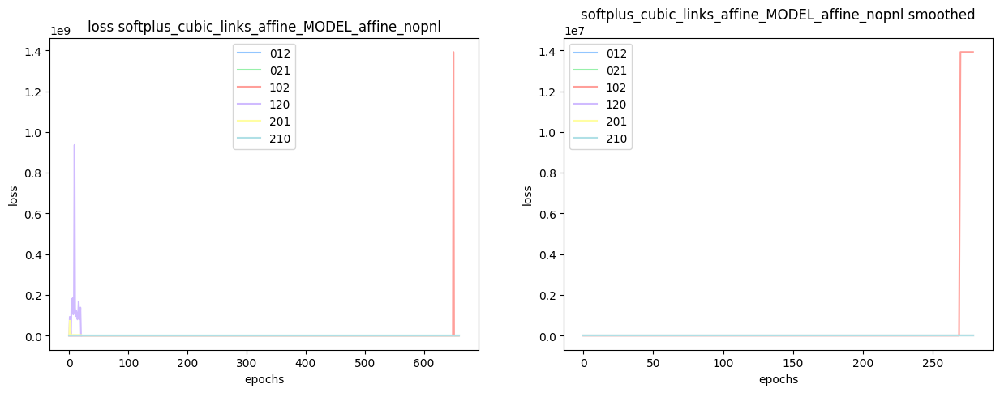

softplus_cubic_links_affine_MODEL_additive_pnl [35/72]


training model 210: 100%|██████████| 33/33 [00:27<00:00,  1.18it/s]


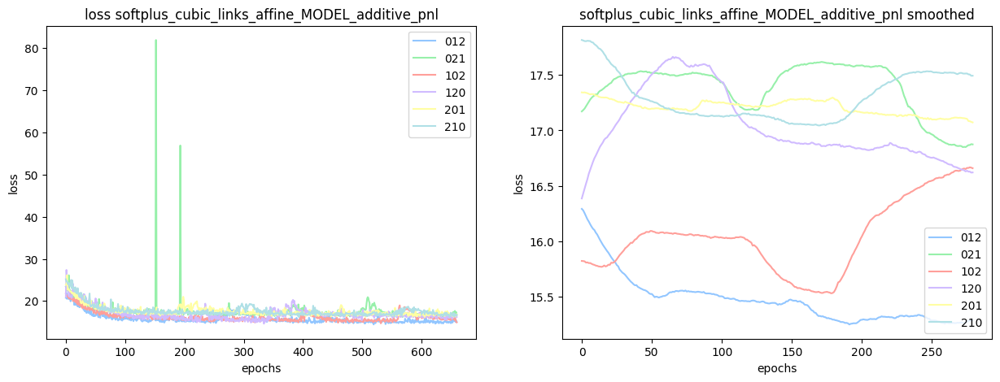

softplus_cubic_links_affine_MODEL_additive_nopnl [36/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.14it/s]


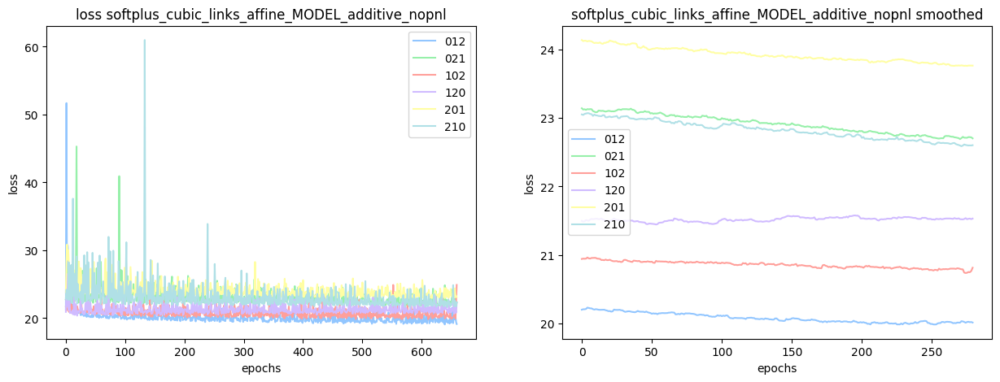

softplus_cubic_links_additive_MODEL_affine_pnl [37/72]


training model 210: 100%|██████████| 33/33 [00:35<00:00,  1.07s/it]


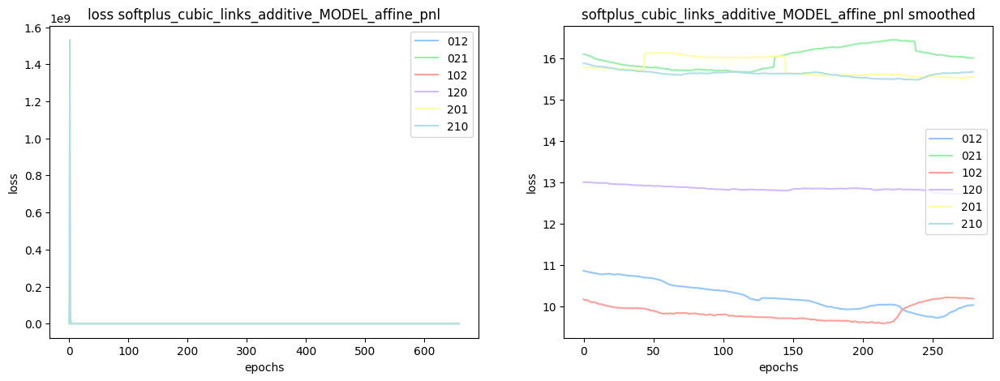

softplus_cubic_links_additive_MODEL_affine_nopnl [38/72]


training model 210: 100%|██████████| 33/33 [00:13<00:00,  2.51it/s]


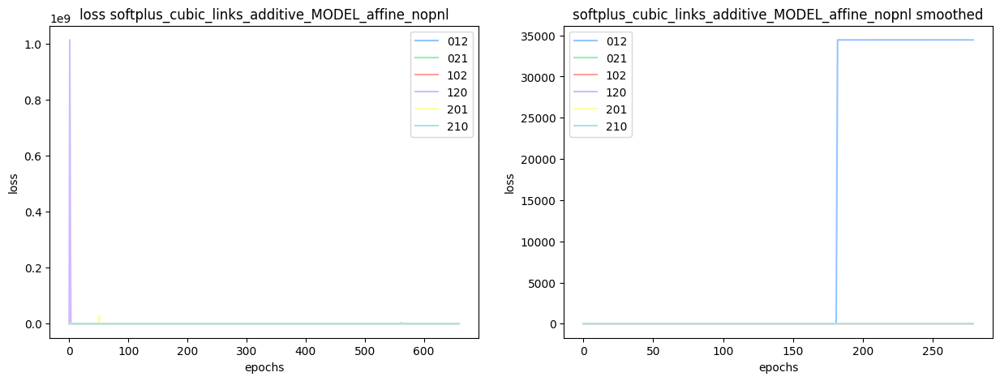

softplus_cubic_links_additive_MODEL_additive_pnl [39/72]


training model 210: 100%|██████████| 33/33 [00:29<00:00,  1.10it/s]


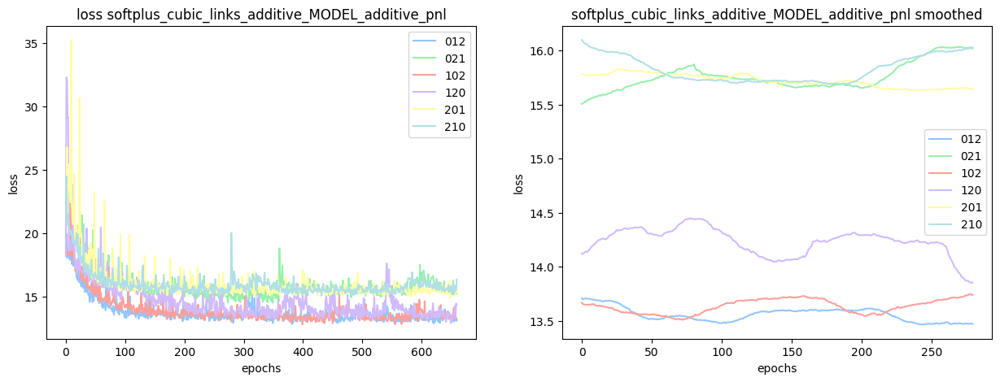

softplus_cubic_links_additive_MODEL_additive_nopnl [40/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.19it/s]


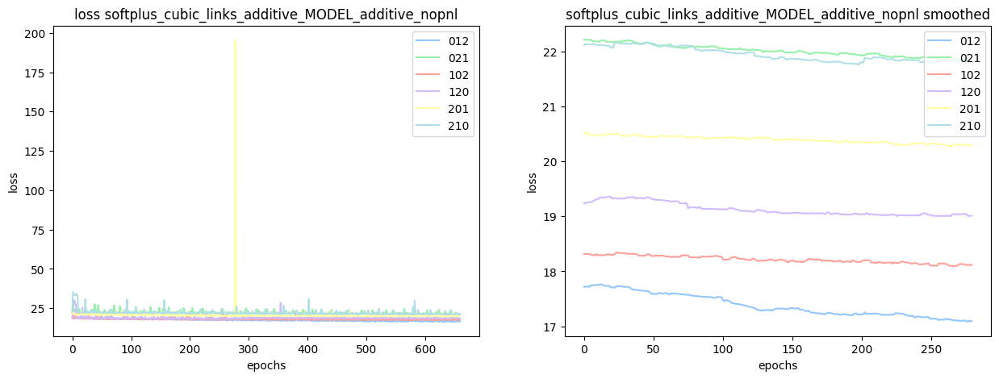

nonparametric_cubic_links_affine_MODEL_affine_pnl [41/72]


training model 012:   0%|          | 0/33 [00:00<?, ?it/s]


Failed!
nonparametric_cubic_links_affine_MODEL_affine_nopnl [42/72]


training model 012:  52%|█████▏    | 17/33 [00:07<00:06,  2.30it/s]


Failed!
nonparametric_cubic_links_affine_MODEL_additive_pnl [43/72]


training model 012:   0%|          | 0/33 [00:00<?, ?it/s]


Failed!
nonparametric_cubic_links_affine_MODEL_additive_nopnl [44/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.28it/s]


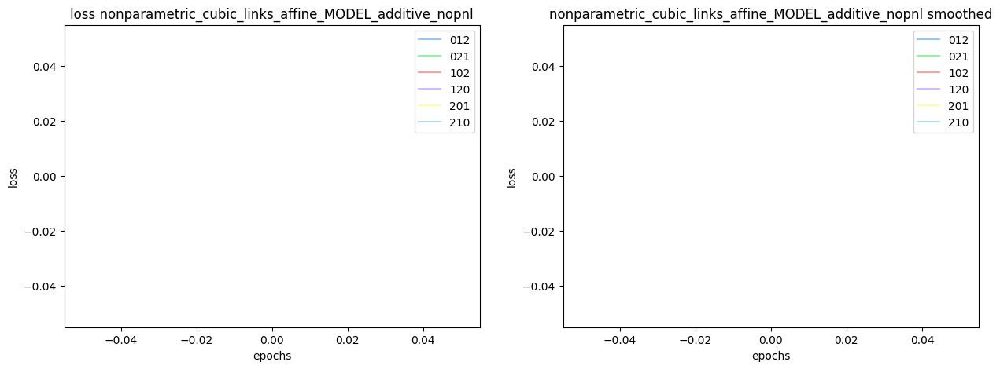

nonparametric_cubic_links_additive_MODEL_affine_pnl [45/72]


training model 012:   0%|          | 0/33 [00:00<?, ?it/s]


Failed!
nonparametric_cubic_links_additive_MODEL_affine_nopnl [46/72]


training model 012:   3%|▎         | 1/33 [00:00<00:19,  1.66it/s]


Failed!
nonparametric_cubic_links_additive_MODEL_additive_pnl [47/72]


training model 012:   0%|          | 0/33 [00:00<?, ?it/s]


Failed!
nonparametric_cubic_links_additive_MODEL_additive_nopnl [48/72]


training model 210: 100%|██████████| 33/33 [00:07<00:00,  4.31it/s]


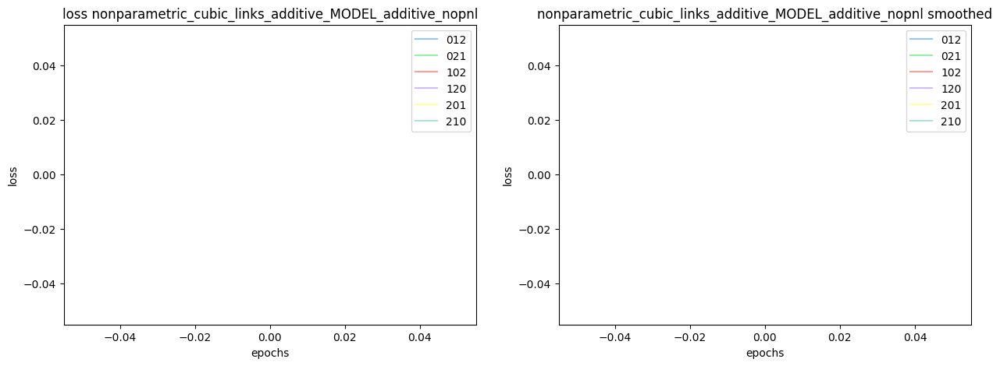

sinusoid_nonparametric_links_affine_MODEL_affine_pnl [49/72]


training model 210: 100%|██████████| 330/330 [00:33<00:00,  9.92it/s]


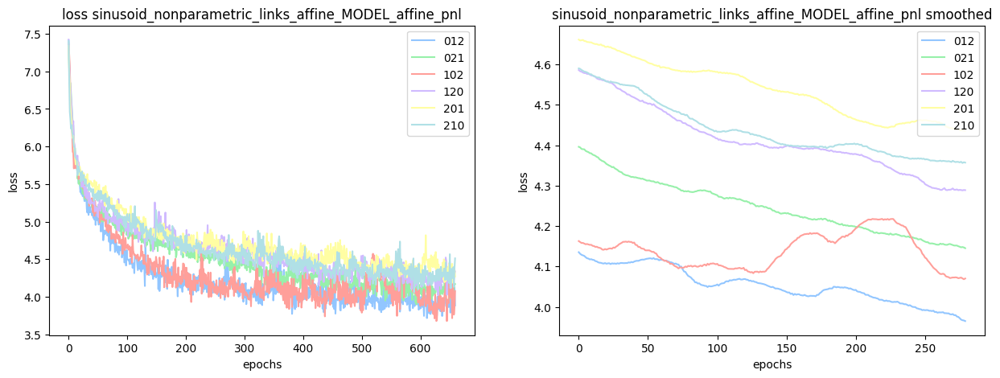

sinusoid_nonparametric_links_affine_MODEL_affine_nopnl [50/72]


training model 210: 100%|██████████| 330/330 [00:13<00:00, 24.41it/s]


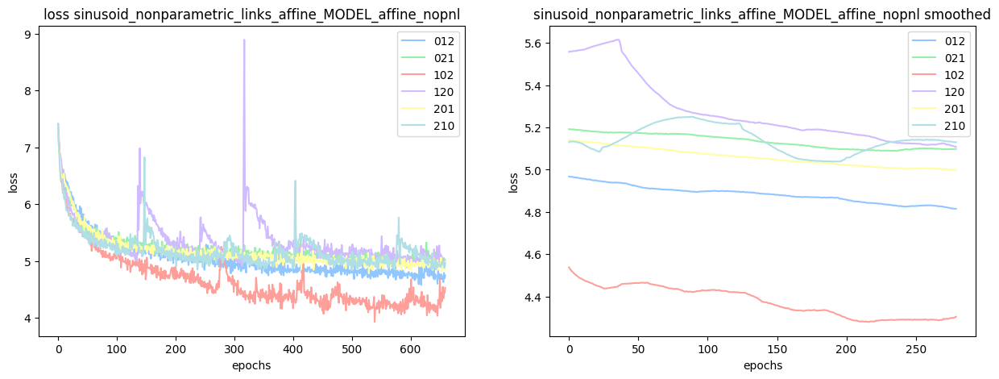

sinusoid_nonparametric_links_affine_MODEL_additive_pnl [51/72]


training model 210: 100%|██████████| 330/330 [00:28<00:00, 11.77it/s]


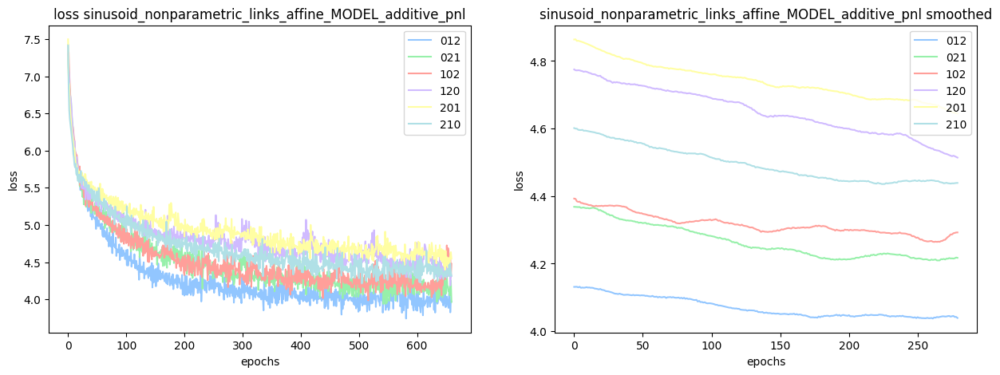

sinusoid_nonparametric_links_affine_MODEL_additive_nopnl [52/72]


training model 210: 100%|██████████| 330/330 [00:07<00:00, 41.96it/s]


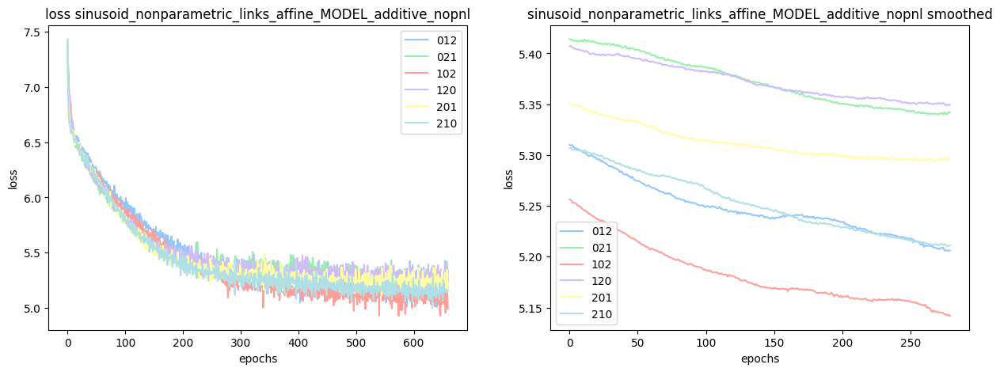

sinusoid_nonparametric_links_additive_MODEL_affine_pnl [53/72]


training model 210: 100%|██████████| 330/330 [00:32<00:00, 10.06it/s]


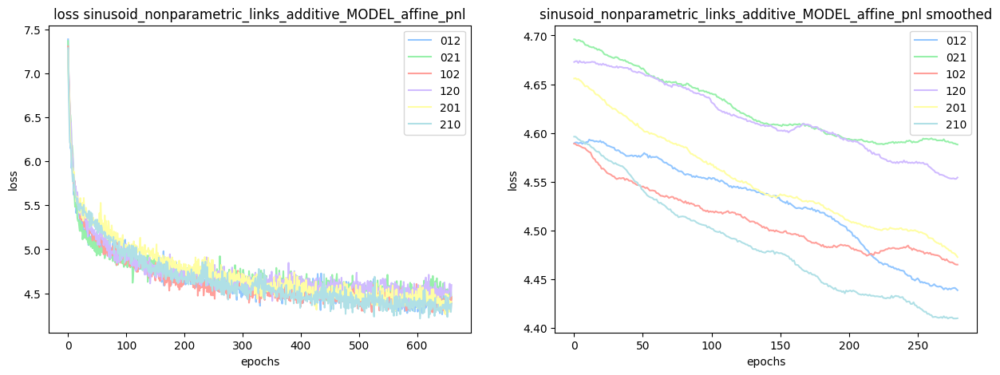

sinusoid_nonparametric_links_additive_MODEL_affine_nopnl [54/72]


training model 210: 100%|██████████| 330/330 [00:13<00:00, 24.47it/s]


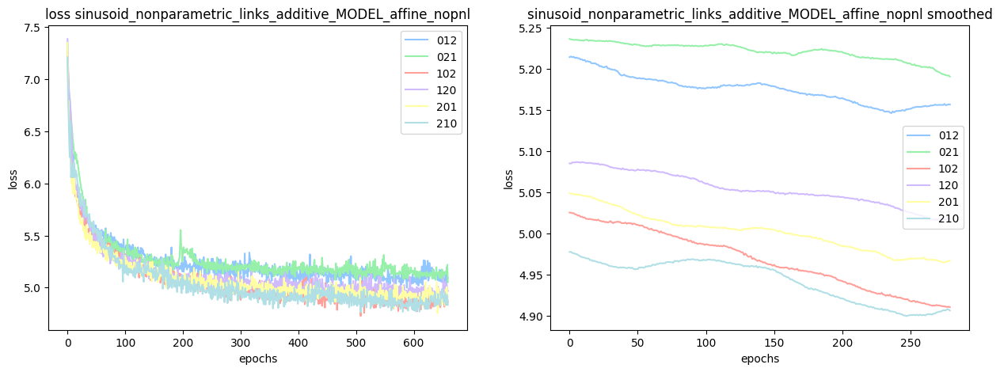

sinusoid_nonparametric_links_additive_MODEL_additive_pnl [55/72]


training model 210: 100%|██████████| 330/330 [00:32<00:00, 10.09it/s]


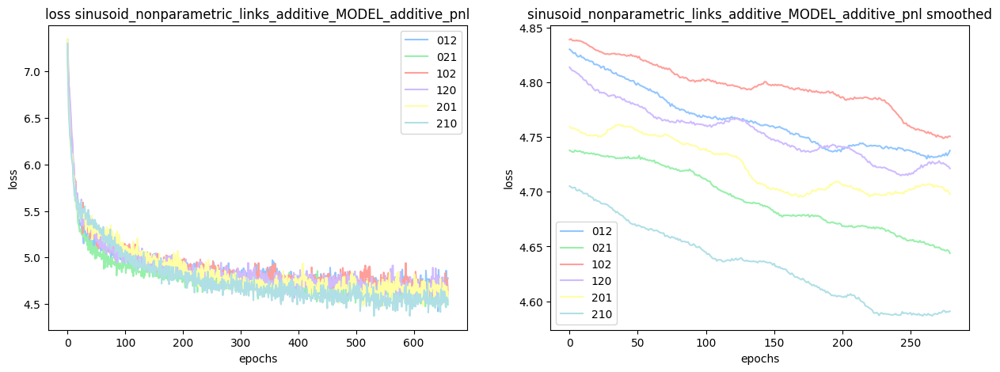

sinusoid_nonparametric_links_additive_MODEL_additive_nopnl [56/72]


training model 210: 100%|██████████| 330/330 [00:08<00:00, 40.16it/s]


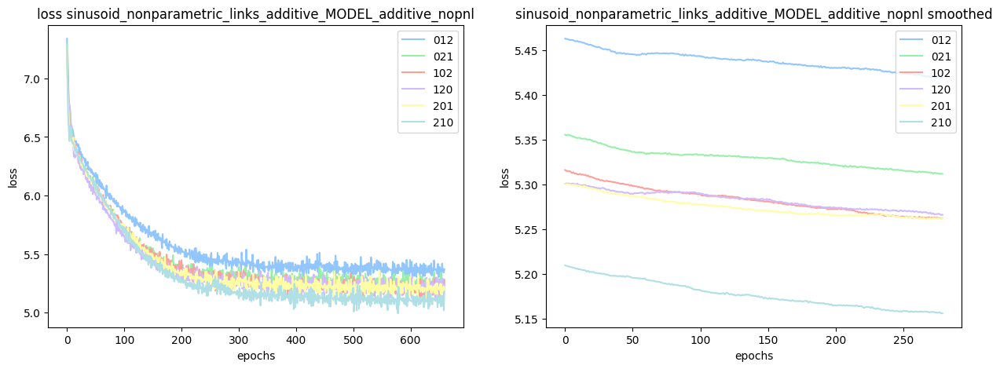

softplus_nonparametric_links_affine_MODEL_affine_pnl [57/72]


training model 210: 100%|██████████| 330/330 [00:30<00:00, 10.92it/s]


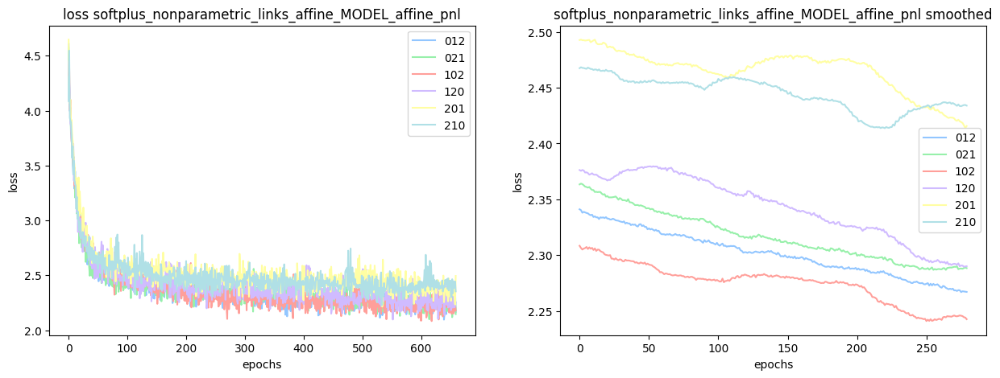

softplus_nonparametric_links_affine_MODEL_affine_nopnl [58/72]


training model 210: 100%|██████████| 330/330 [00:13<00:00, 24.29it/s]


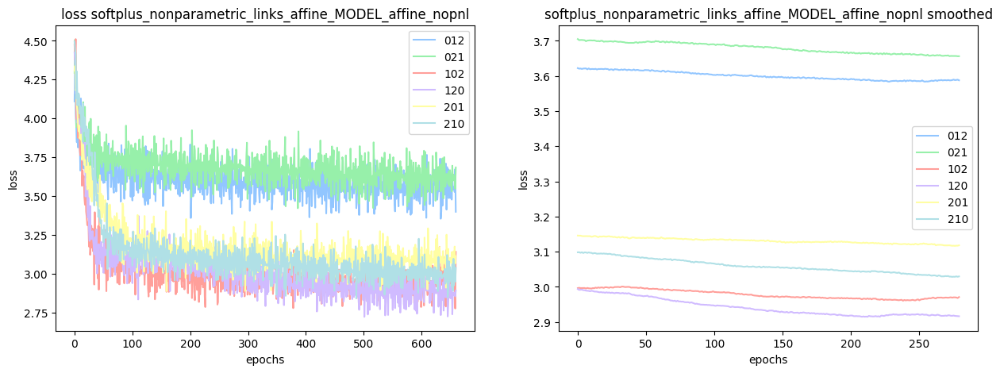

softplus_nonparametric_links_affine_MODEL_additive_pnl [59/72]


training model 210: 100%|██████████| 330/330 [00:30<00:00, 10.95it/s]


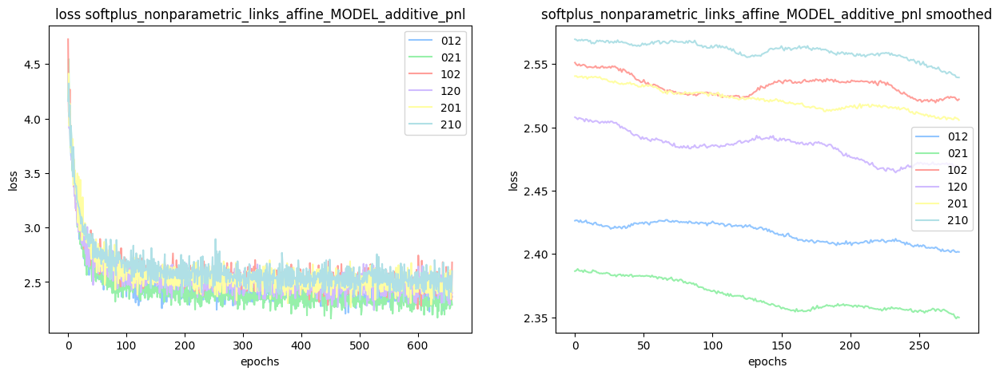

softplus_nonparametric_links_affine_MODEL_additive_nopnl [60/72]


training model 210: 100%|██████████| 330/330 [00:08<00:00, 41.18it/s]


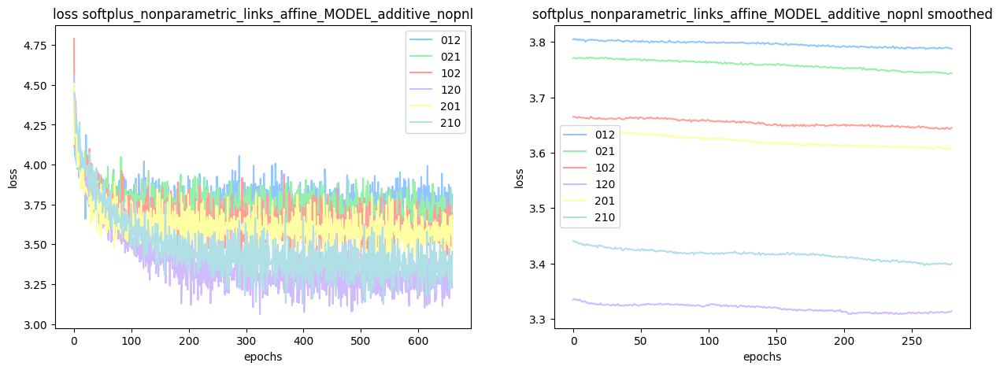

softplus_nonparametric_links_additive_MODEL_affine_pnl [61/72]


training model 210: 100%|██████████| 330/330 [00:33<00:00,  9.97it/s]


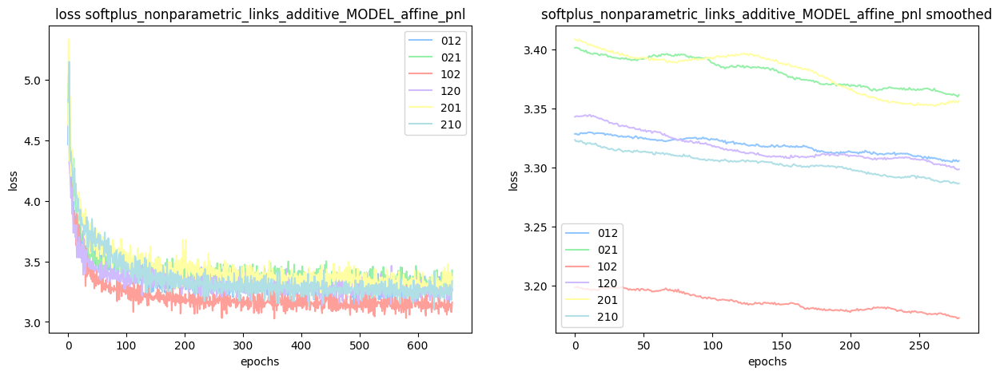

softplus_nonparametric_links_additive_MODEL_affine_nopnl [62/72]


training model 210: 100%|██████████| 330/330 [00:13<00:00, 24.80it/s]


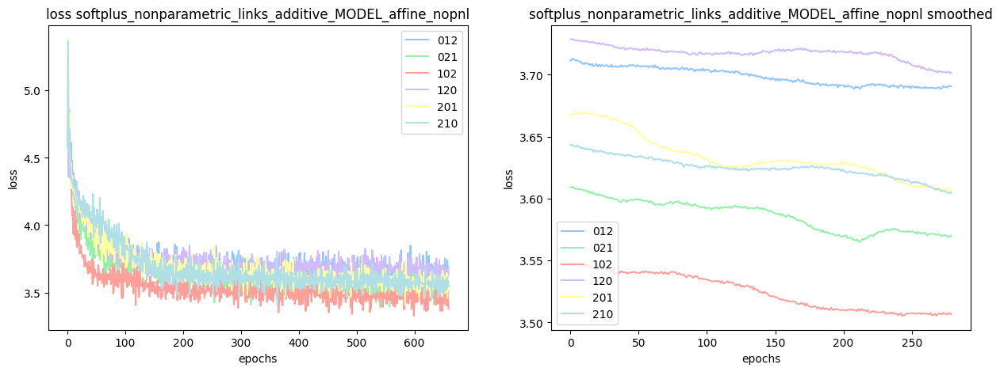

softplus_nonparametric_links_additive_MODEL_additive_pnl [63/72]


training model 210: 100%|██████████| 330/330 [00:27<00:00, 11.93it/s]


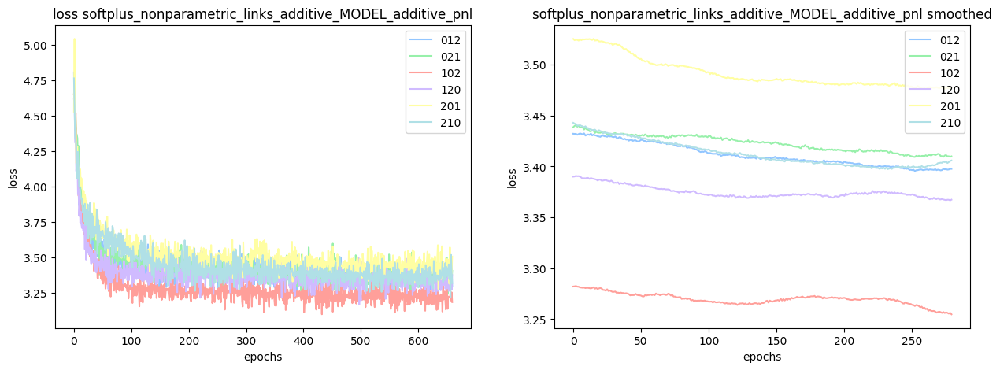

softplus_nonparametric_links_additive_MODEL_additive_nopnl [64/72]


training model 210: 100%|██████████| 330/330 [00:07<00:00, 42.41it/s]


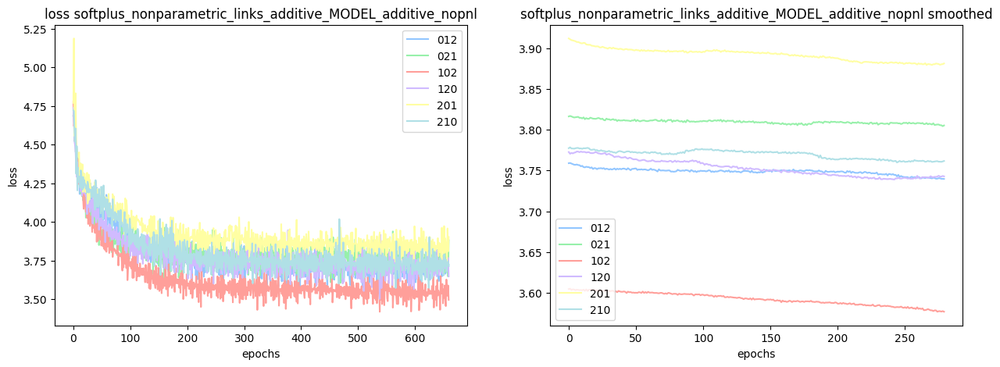

nonparametric_nonparametric_links_affine_MODEL_affine_pnl [65/72]


training model 210: 100%|██████████| 330/330 [00:31<00:00, 10.39it/s]


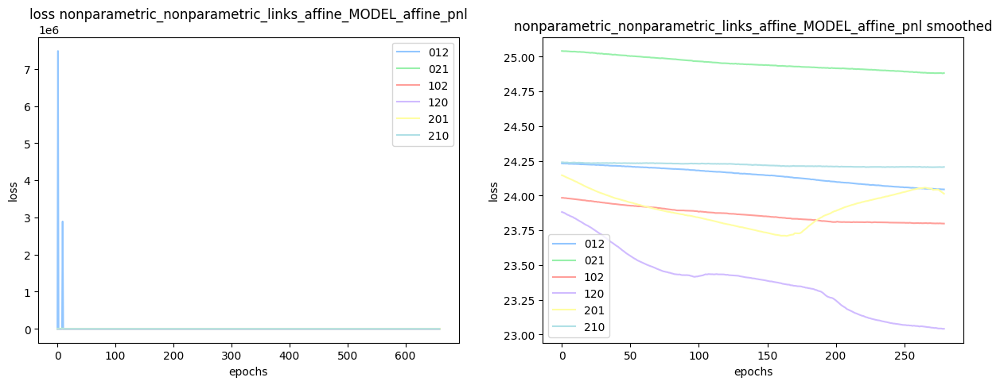

nonparametric_nonparametric_links_affine_MODEL_affine_nopnl [66/72]


training model 210: 100%|██████████| 330/330 [00:10<00:00, 30.23it/s]


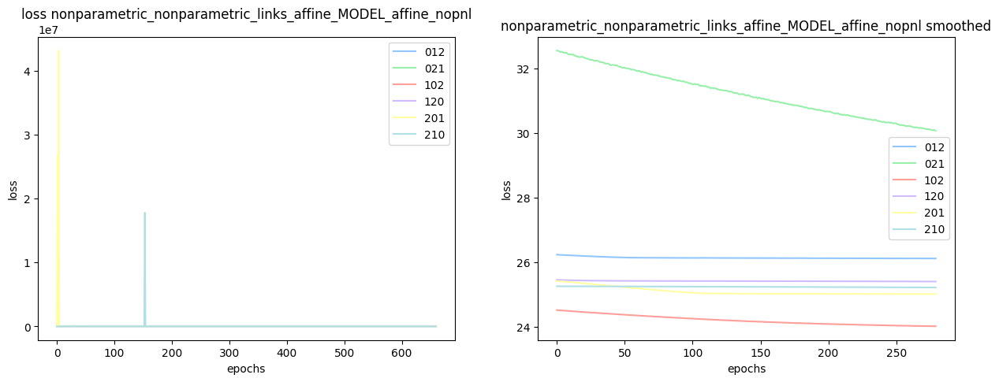

nonparametric_nonparametric_links_affine_MODEL_additive_pnl [67/72]


training model 210: 100%|██████████| 330/330 [00:19<00:00, 17.15it/s]


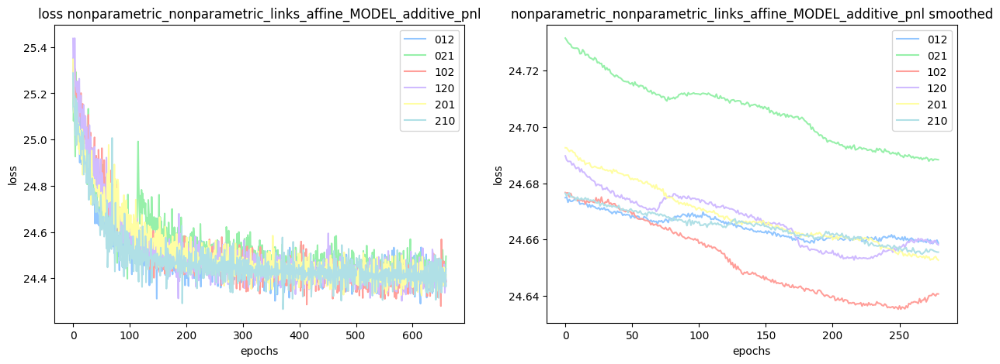

nonparametric_nonparametric_links_affine_MODEL_additive_nopnl [68/72]


training model 210: 100%|██████████| 330/330 [00:06<00:00, 53.13it/s]


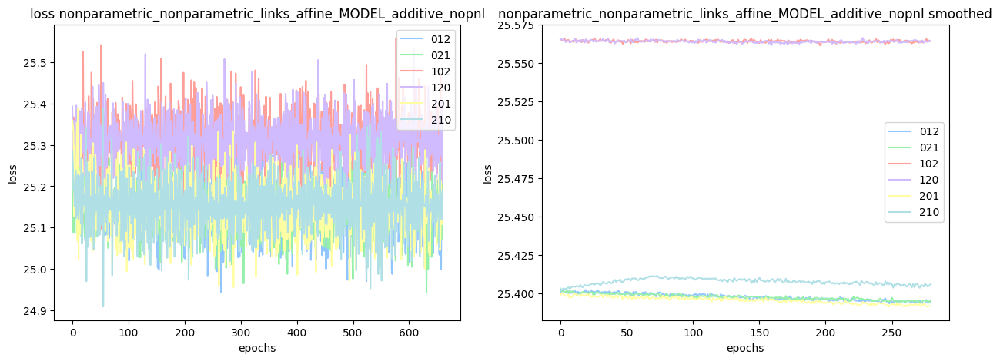

nonparametric_nonparametric_links_additive_MODEL_affine_pnl [69/72]


training model 210: 100%|██████████| 330/330 [00:33<00:00,  9.92it/s]


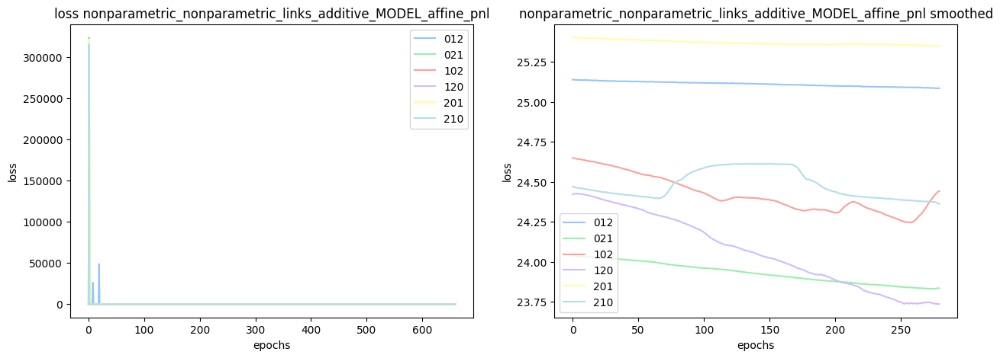

nonparametric_nonparametric_links_additive_MODEL_affine_nopnl [70/72]


training model 210: 100%|██████████| 330/330 [00:11<00:00, 28.33it/s]


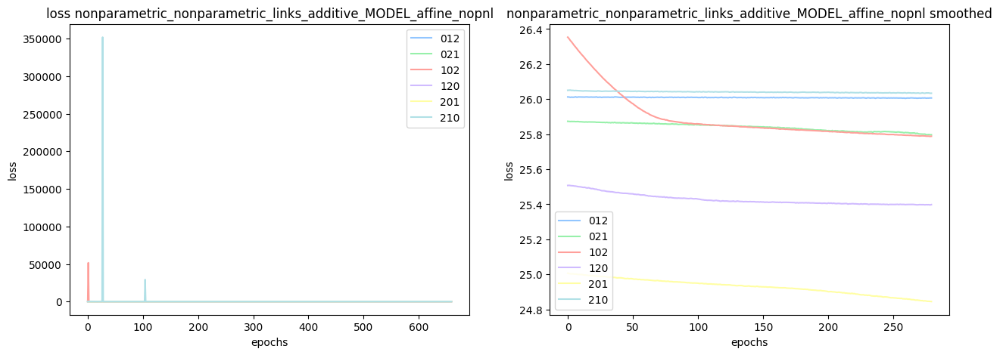

nonparametric_nonparametric_links_additive_MODEL_additive_pnl [71/72]


training model 210: 100%|██████████| 330/330 [00:24<00:00, 13.32it/s]


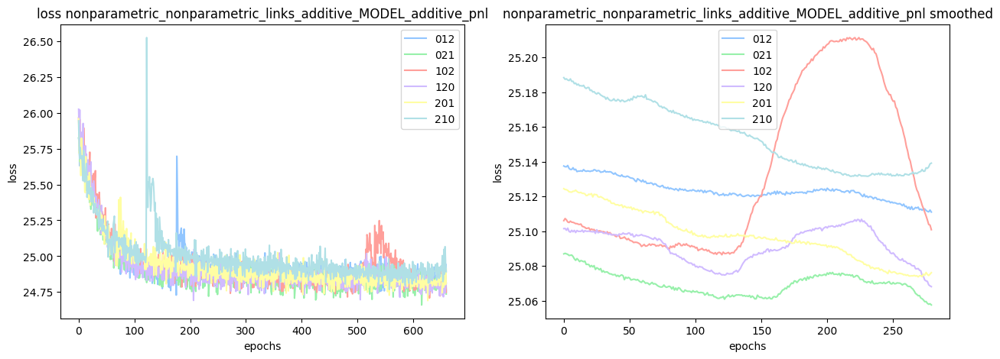

nonparametric_nonparametric_links_additive_MODEL_additive_nopnl [72/72]


training model 210: 100%|██████████| 330/330 [00:06<00:00, 49.30it/s]


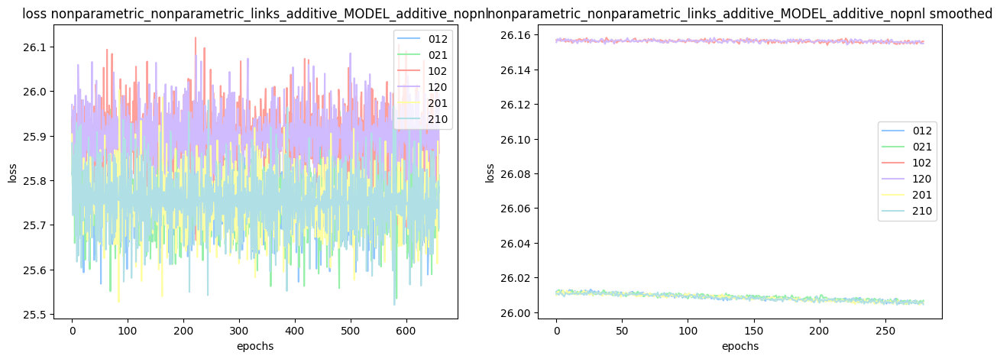

In [4]:

subset_to_consider = list(all_training_settings.keys())
all_models_trained = {}
all_histories = {}
idx = 0
for key in subset_to_consider:
    idx += 1
    print(f"{key} [{idx}/{len(subset_to_consider)}]")
    try:
        dset = all_datasets[key]
        all_models_trained[key] = create_new_set_of_models(**all_models_setting[key])
            
        all_histories[key] = train_models_and_get_histories(**all_training_settings[key], dset=dset, all_models=all_models_trained[key])
        smoothed_histories = smooth_graph(all_histories[key], window_size=window_sizes[key])
        # create two subplots and unpack the output array immediately
        plt.figure(figsize=(15, 5))
        plt.subplot(121)
        plt.title(f"loss {key}")
        plt.xlabel("epochs")
        plt.ylabel("loss")
        for order in all_histories[key].keys():
            plt.plot(all_histories[key][order], label=order)
        plt.legend()
        plt.subplot(122)
        plt.xlabel("epochs")
        plt.ylabel("loss")
        for order in all_histories[key].keys():
            ending_portion = int(output_history_portion[key] * len(smoothed_histories[order]))
            plt.plot(smoothed_histories[order][-ending_portion:], label=order)
        plt.title(f"{key} smoothed")
        plt.legend()
        plt.show()
    except Exception as e:
        print("Failed!")